In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import statsmodels.api as sm

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
df= pd.read_excel('PJMW_MW_Hourly.xlsx')
df

,Datetime,PJMW_MW
0,2002-12-31 01:00:00,5077
1,2002-12-31 02:00:00,4939
2,2002-12-31 03:00:00,4885
3,2002-12-31 04:00:00,4857
4,2002-12-31 05:00:00,4930
...,...,...
143201,2018-01-01 20:00:00,8401
143202,2018-01-01 21:00:00,8373
143203,2018-01-01 22:00:00,8238
143204,2018-01-01 23:00:00,7958


In [3]:
df = df.sort_values(by='Datetime', ascending=True).reset_index(drop=True)
df

,Datetime,PJMW_MW
0,2002-04-01 01:00:00,4374
1,2002-04-01 02:00:00,4306
2,2002-04-01 03:00:00,4322
3,2002-04-01 04:00:00,4359
4,2002-04-01 05:00:00,4436
...,...,...
143201,2018-08-02 20:00:00,6545
143202,2018-08-02 21:00:00,6496
143203,2018-08-02 22:00:00,6325
143204,2018-08-02 23:00:00,5892


In [4]:
df["Year"] = df["Datetime"].dt.year
df["Quater"] = df["Datetime"].dt.quarter
df["Month"] = df["Datetime"].dt.month
df["Weeks"] = df["Datetime"].dt.weekofyear
df["Daysofmonth"] = df["Datetime"].dt.day
df["Daysofyear"] = df["Datetime"].dt.dayofyear
df["Hour"] = df["Datetime"].dt.hour
df["Day"] = df["Datetime"].dt.dayofweek
df['date_offset'] = (df.Datetime.dt.month*100 + df.Datetime.dt.day - 320)%1300
df['season'] = pd.cut(df['date_offset'], [0, 300, 602, 900, 1300], 
                      labels=['Spring', 'Summer', 'Fall', 'Winter'])

In [5]:
df.head()

,Datetime,PJMW_MW,Year,Quater,Month,Weeks,Daysofmonth,Daysofyear,Hour,Day,date_offset,season
0,2002-04-01 01:00:00,4374,2002,2,4,14,1,91,1,0,81,Spring
1,2002-04-01 02:00:00,4306,2002,2,4,14,1,91,2,0,81,Spring
2,2002-04-01 03:00:00,4322,2002,2,4,14,1,91,3,0,81,Spring
3,2002-04-01 04:00:00,4359,2002,2,4,14,1,91,4,0,81,Spring
4,2002-04-01 05:00:00,4436,2002,2,4,14,1,91,5,0,81,Spring


In [6]:
df.index = df.Datetime

In [7]:
df.head()

,Datetime,PJMW_MW,Year,Quater,Month,Weeks,Daysofmonth,Daysofyear,Hour,Day,date_offset,season
Datetime,,,,,,,,,,,,
2002-04-01 01:00:00,2002-04-01 01:00:00,4374,2002,2,4,14,1,91,1,0,81,Spring
2002-04-01 02:00:00,2002-04-01 02:00:00,4306,2002,2,4,14,1,91,2,0,81,Spring
2002-04-01 03:00:00,2002-04-01 03:00:00,4322,2002,2,4,14,1,91,3,0,81,Spring
2002-04-01 04:00:00,2002-04-01 04:00:00,4359,2002,2,4,14,1,91,4,0,81,Spring
2002-04-01 05:00:00,2002-04-01 05:00:00,4436,2002,2,4,14,1,91,5,0,81,Spring


df = df.drop(columns=['Datetime'])

In [8]:
df.head()

,Datetime,PJMW_MW,Year,Quater,Month,Weeks,Daysofmonth,Daysofyear,Hour,Day,date_offset,season
Datetime,,,,,,,,,,,,
2002-04-01 01:00:00,2002-04-01 01:00:00,4374,2002,2,4,14,1,91,1,0,81,Spring
2002-04-01 02:00:00,2002-04-01 02:00:00,4306,2002,2,4,14,1,91,2,0,81,Spring
2002-04-01 03:00:00,2002-04-01 03:00:00,4322,2002,2,4,14,1,91,3,0,81,Spring
2002-04-01 04:00:00,2002-04-01 04:00:00,4359,2002,2,4,14,1,91,4,0,81,Spring
2002-04-01 05:00:00,2002-04-01 05:00:00,4436,2002,2,4,14,1,91,5,0,81,Spring


In [9]:
df['season'].unique()

['Spring', 'Summer', 'Fall', 'Winter', NaN]
Categories (4, object): ['Spring' < 'Summer' < 'Fall' < 'Winter']

In [10]:
df['season'] = df['season'].fillna('Summer')

In [11]:
start_date= pd.to_datetime('2014-01-01')
end_date= pd.to_datetime('2018-12-31')
mask=(df['Datetime']>= start_date) & (df['Datetime']<= end_date)
temp= df.loc[mask]

In [12]:
temp.head()

,Datetime,PJMW_MW,Year,Quater,Month,Weeks,Daysofmonth,Daysofyear,Hour,Day,date_offset,season
Datetime,,,,,,,,,,,,
2014-01-01 00:00:00,2014-01-01 00:00:00,6085,2014,1,1,1,1,1,0,2,1081,Winter
2014-01-01 01:00:00,2014-01-01 01:00:00,5896,2014,1,1,1,1,1,1,2,1081,Winter
2014-01-01 02:00:00,2014-01-01 02:00:00,5779,2014,1,1,1,1,1,2,2,1081,Winter
2014-01-01 03:00:00,2014-01-01 03:00:00,5664,2014,1,1,1,1,1,3,2,1081,Winter
2014-01-01 04:00:00,2014-01-01 04:00:00,5631,2014,1,1,1,1,1,4,2,1081,Winter


In [13]:
temp.shape

(40200, 12)

In [14]:
data= temp.drop(columns=['Datetime','Weeks','Daysofmonth','Daysofyear','Day','date_offset'])
data

,PJMW_MW,Year,Quater,Month,Hour,season
Datetime,,,,,,
2014-01-01 00:00:00,6085,2014,1,1,0,Winter
2014-01-01 01:00:00,5896,2014,1,1,1,Winter
2014-01-01 02:00:00,5779,2014,1,1,2,Winter
2014-01-01 03:00:00,5664,2014,1,1,3,Winter
2014-01-01 04:00:00,5631,2014,1,1,4,Winter
...,...,...,...,...,...,...
2018-08-02 20:00:00,6545,2018,3,8,20,Summer
2018-08-02 21:00:00,6496,2018,3,8,21,Summer
2018-08-02 22:00:00,6325,2018,3,8,22,Summer


# Checking for seasonality

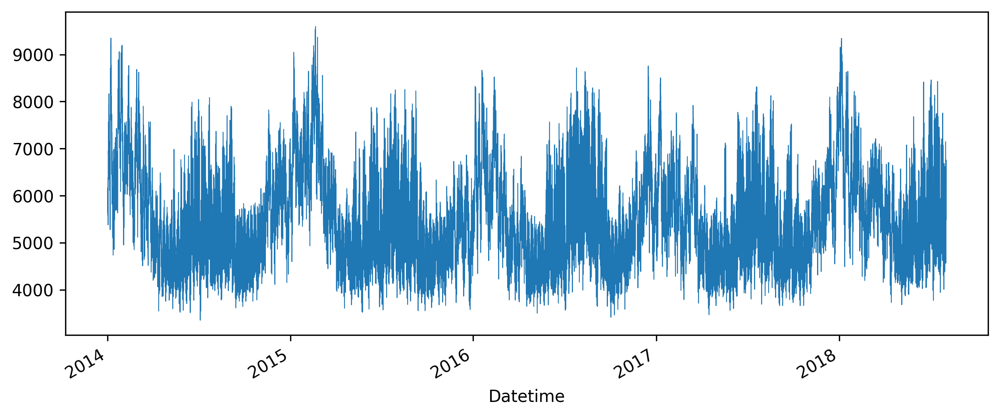

In [15]:
plt.rcParams['figure.dpi']=300
plt.rcParams['figure.figsize']=(10,4)
data['PJMW_MW'].plot(linewidth=0.5);

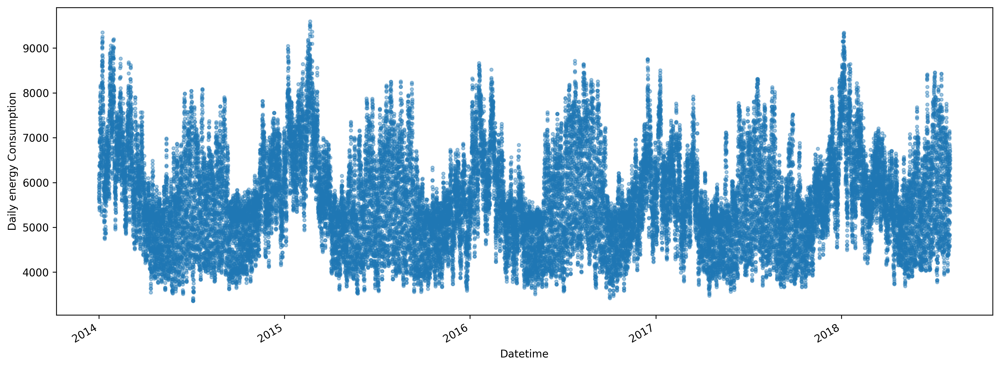

In [16]:
axes      = data['PJMW_MW'].plot(marker='.',
                                       alpha=0.4, 
                                       linestyle='None', 
                                       figsize=(16, 6), 
                                       subplots=True)

for ax in axes:
    ax.set_ylabel('Daily energy Consumption')

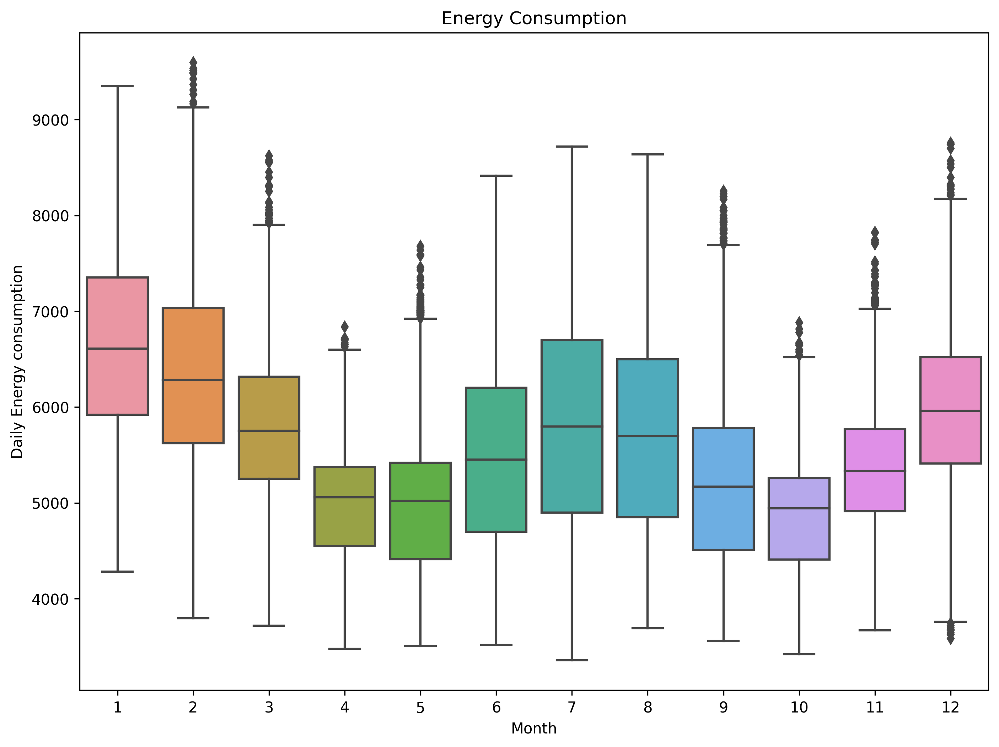

In [17]:
fig, ax = plt.subplots(figsize=(11, 8))

sns.boxplot(data=data, x='Month', y='PJMW_MW', ax=ax)

ax.set_title('Energy Consumption')

ax.set_ylabel('Daily Energy consumption');

In [18]:
data.loc['2014':]

,PJMW_MW,Year,Quater,Month,Hour,season
Datetime,,,,,,
2014-01-01 00:00:00,6085,2014,1,1,0,Winter
2014-01-01 01:00:00,5896,2014,1,1,1,Winter
2014-01-01 02:00:00,5779,2014,1,1,2,Winter
2014-01-01 03:00:00,5664,2014,1,1,3,Winter
2014-01-01 04:00:00,5631,2014,1,1,4,Winter
...,...,...,...,...,...,...
2018-08-02 20:00:00,6545,2018,3,8,20,Summer
2018-08-02 21:00:00,6496,2018,3,8,21,Summer
2018-08-02 22:00:00,6325,2018,3,8,22,Summer


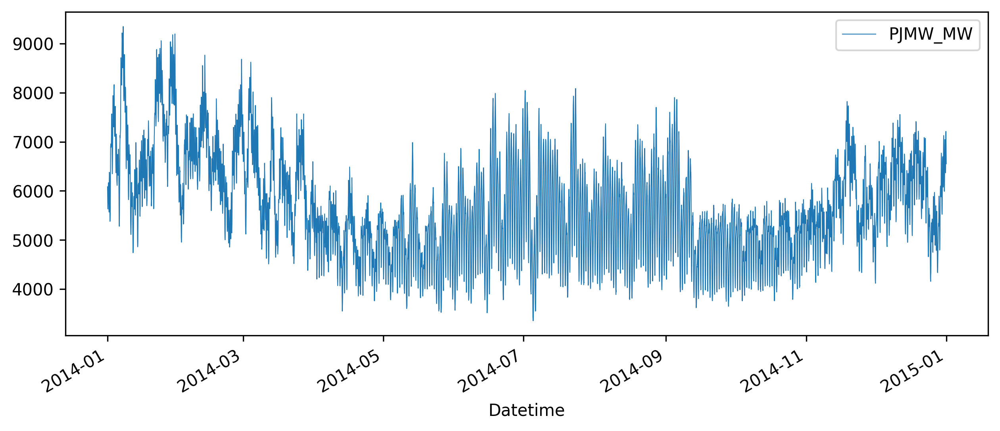

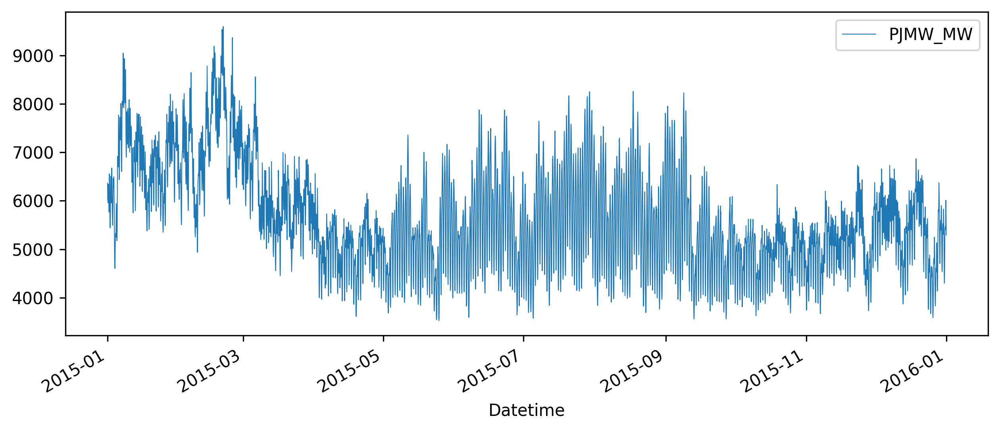

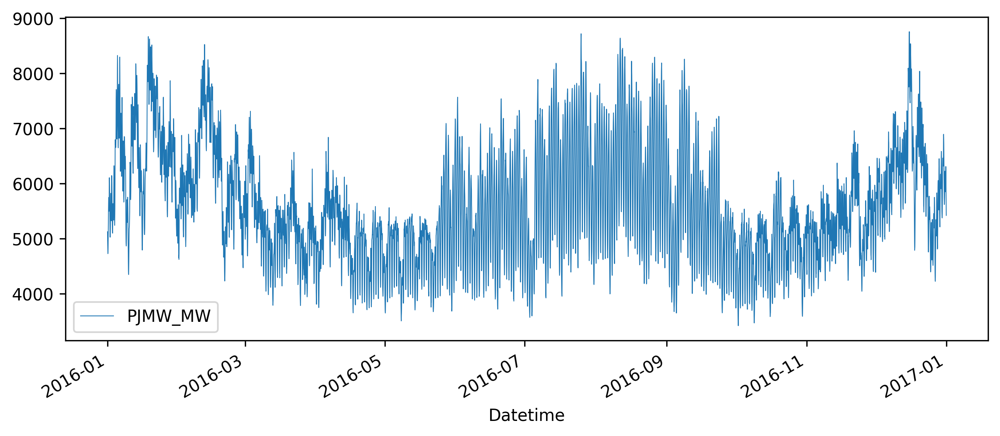

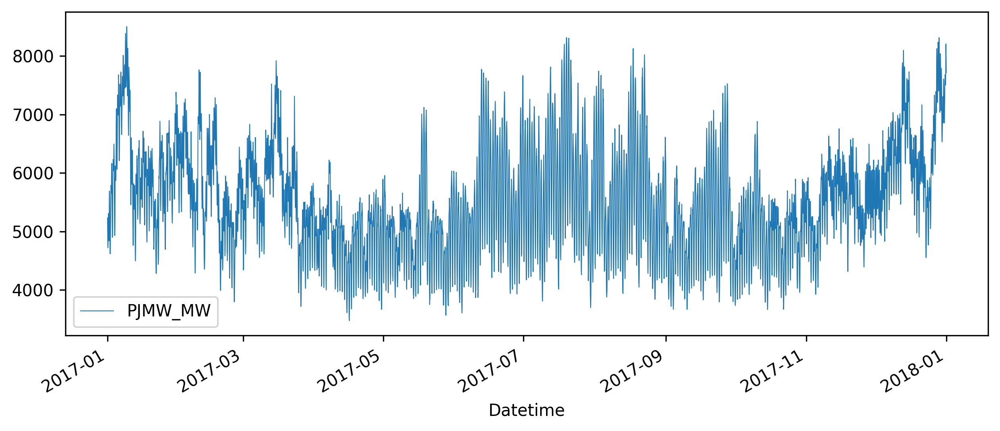

In [19]:
cols_plot = ['PJMW_MW']

data.loc['2014'][cols_plot].plot(linewidth=0.5);
data.loc['2015'][cols_plot].plot(linewidth=0.5);
data.loc['2016'][cols_plot].plot(linewidth=0.5);
data.loc['2017'][cols_plot].plot(linewidth=0.5);

    There seems to indication of seasonality and same pattern repeating from starting of year to  end, but we can not see the certain seasonality.

    we can roll-up the data, weekly & monthly and then re-plot

In [20]:
# weekly sales
data_columns = ['PJMW_MW']

# Resample to weekly frequency, aggregating with mean
data_weekly = data[data_columns].resample('W').sum()
data_weekly.head()

,PJMW_MW
Datetime,
2014-01-05,805399
2014-01-12,1161787
2014-01-19,1061416
2014-01-26,1261550
2014-02-02,1203402


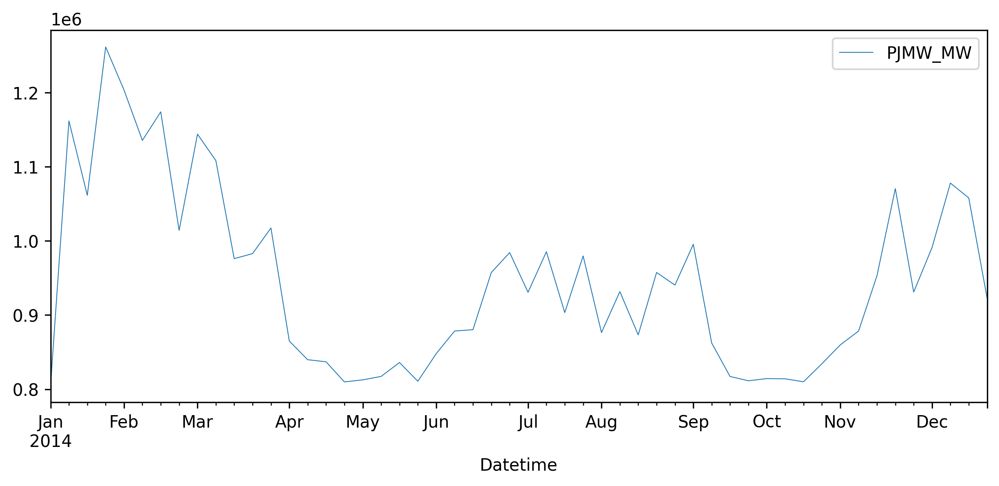

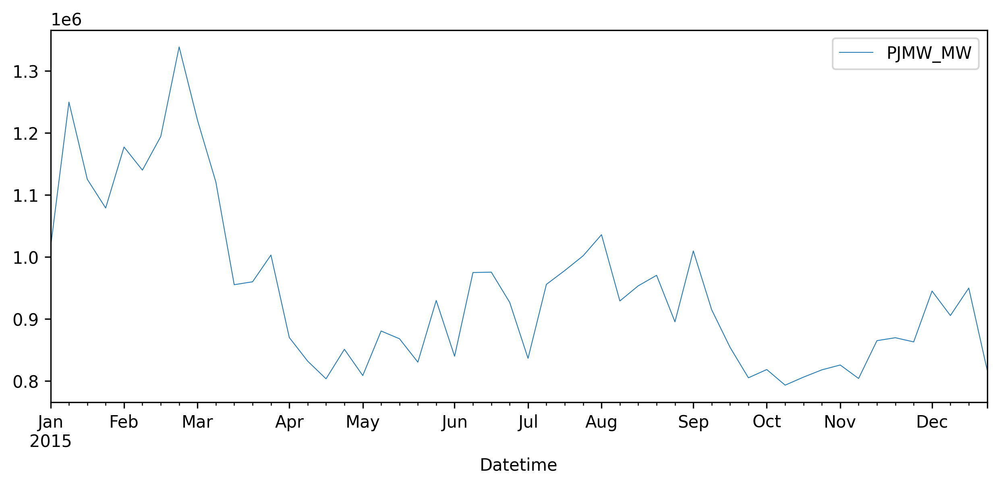

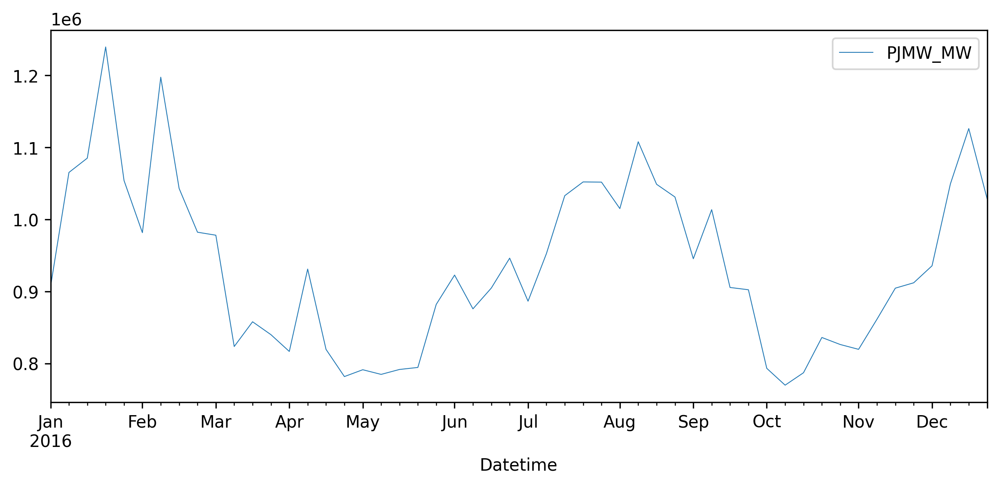

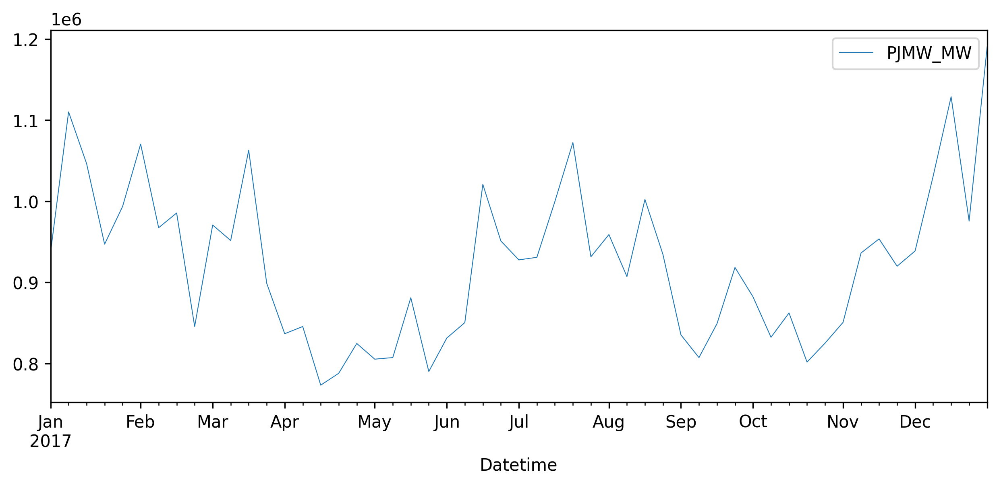

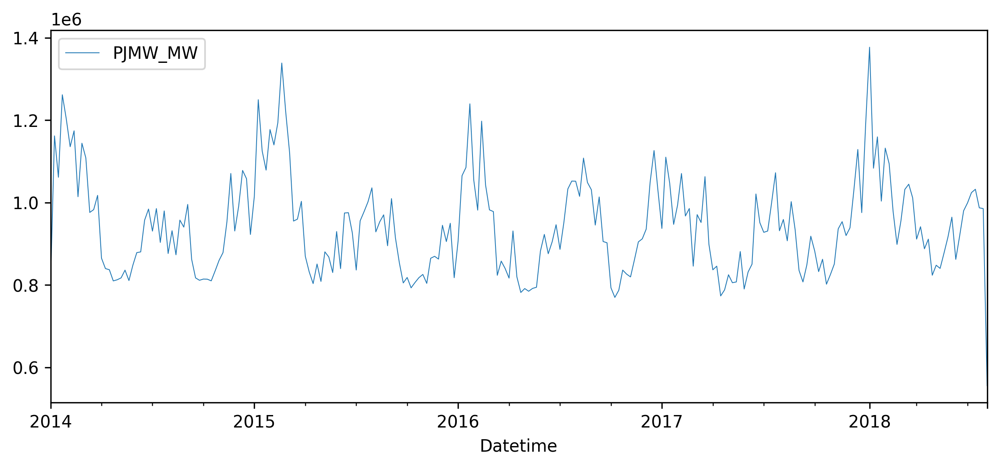

In [21]:
cols_plot = ['PJMW_MW']

data_weekly.loc['2014'][cols_plot].plot(linewidth=0.5);
data_weekly.loc['2015'][cols_plot].plot(linewidth=0.5);
data_weekly.loc['2016'][cols_plot].plot(linewidth=0.5);
data_weekly.loc['2017'][cols_plot].plot(linewidth=0.5);
data_weekly[cols_plot].plot(linewidth=0.5);

In [22]:
# monthly sales
data_columns = ['PJMW_MW']

# Resample to weekly frequency, aggregating with mean
data_monthly = data[data_columns].resample('M').sum()
data_monthly.head(3)

,PJMW_MW
Datetime,
2014-01-31,5215339
2014-02-28,4446508
2014-03-31,4518866


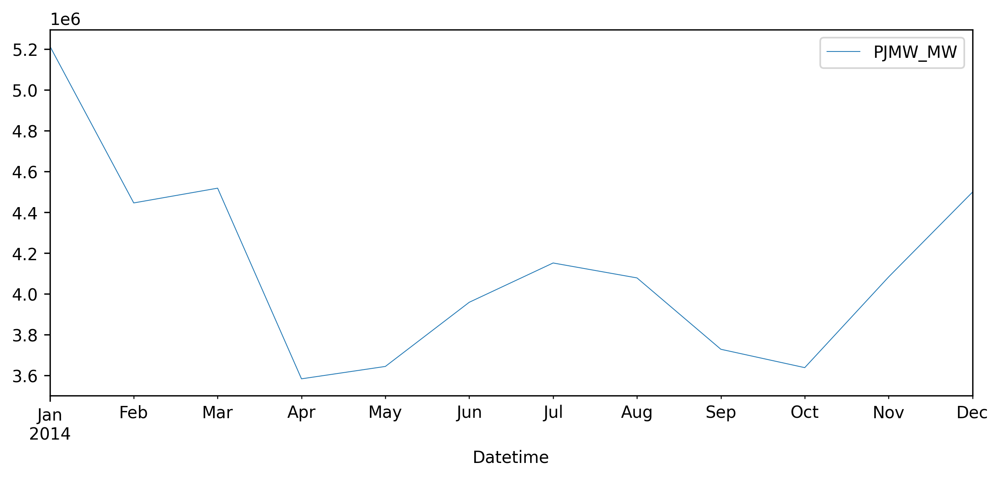

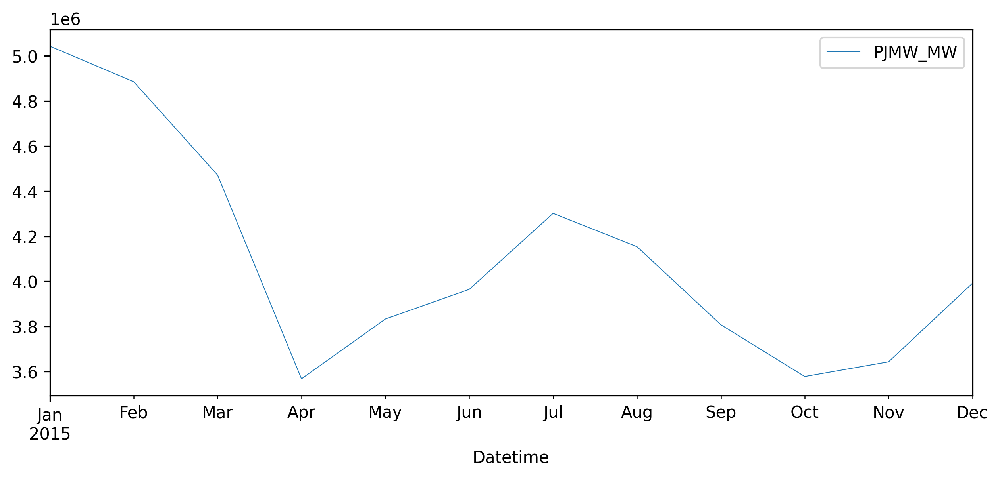

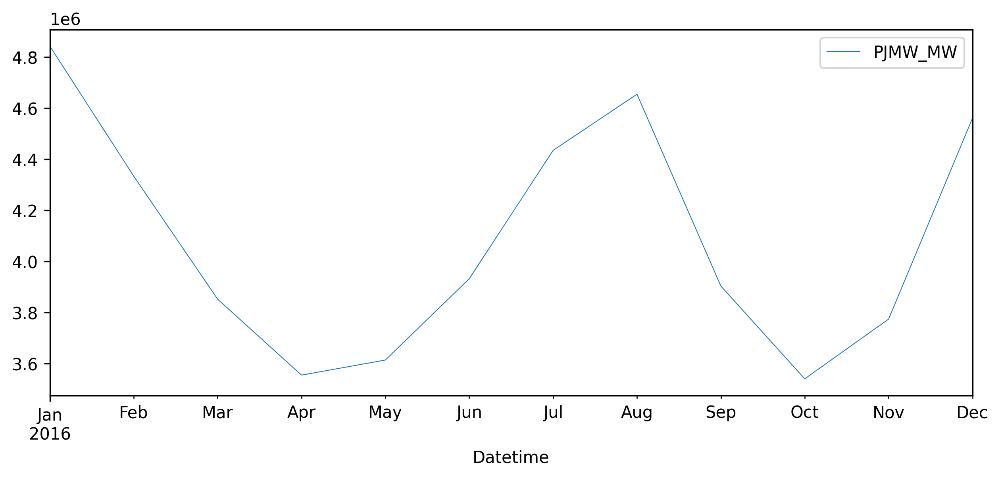

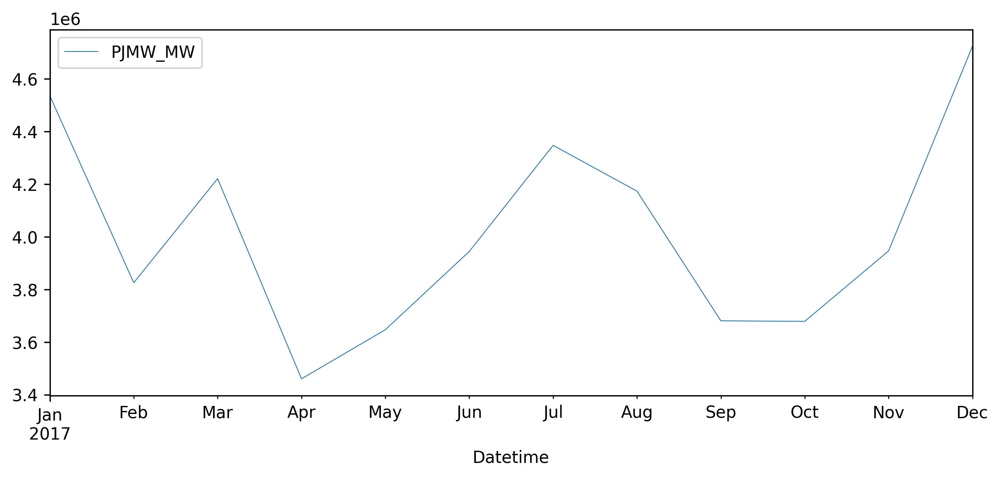

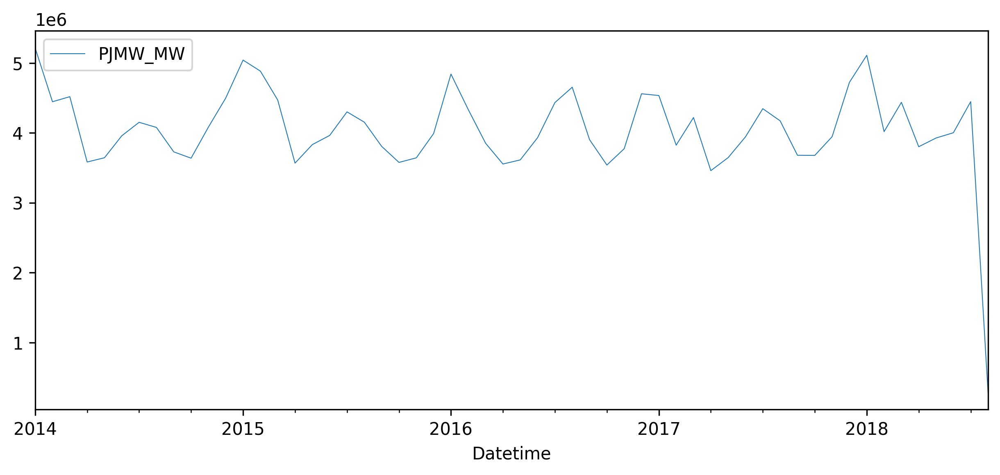

In [23]:
cols_plot = ['PJMW_MW']

data_monthly.loc['2014'][cols_plot].plot(linewidth=0.5);
data_monthly.loc['2015'][cols_plot].plot(linewidth=0.5);
data_monthly.loc['2016'][cols_plot].plot(linewidth=0.5);
data_monthly.loc['2017'][cols_plot].plot(linewidth=0.5);
data_monthly[cols_plot].plot(linewidth=0.5);

    As we can see that, some amount of seasonality is present    

# Checking for Trend

In [24]:
# define a function to check trend and plot

def detect_trend (X_df):
    coefficients, residuals, _, _, _ = np.polyfit(range(len(X_df)),
                                                  X_df,
                                                  1,
                                                  full=True)

    mse = residuals[0]/(len(X_df))
    nrmse = np.sqrt(mse)/(X_df.max() - X_df.min())

    print('Slope ' + str(coefficients[0]))
    print('NRMSE: ' + str(nrmse))

    plt.xticks(rotation=90)
    plt.plot(X_df, 
             marker='.', 
             linestyle='-', 
             linewidth=0.5,
             color='blue',  
             label='Original')
    
    plt.plot([coefficients[0]*x + coefficients[1] for x in range(len(X_df))],
             marker='o', 
             markersize=8, 
             linestyle='-', 
             linewidth=0.5,
             color='orange',
             label='Regression line');
    plt.legend()
    plt.show()

Slope -52741.702797202975
NRMSE: 0.25875874869632987


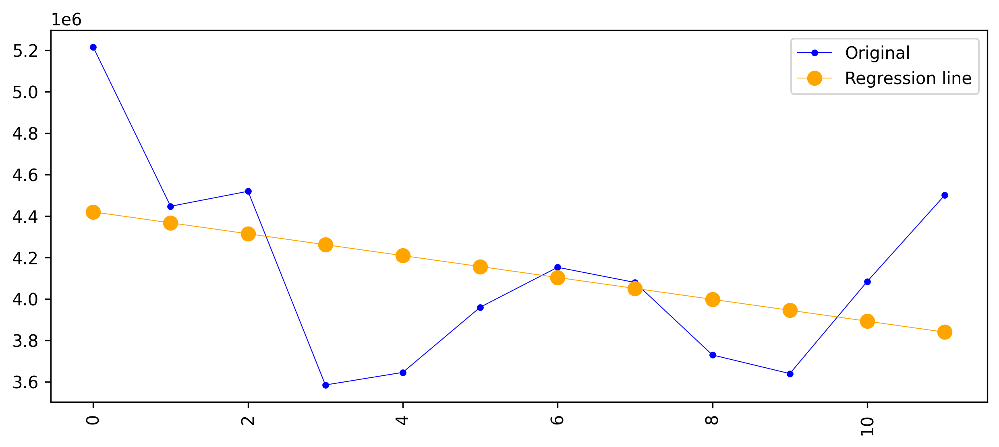

Slope -92611.20279720293
NRMSE: 0.23242257479281422


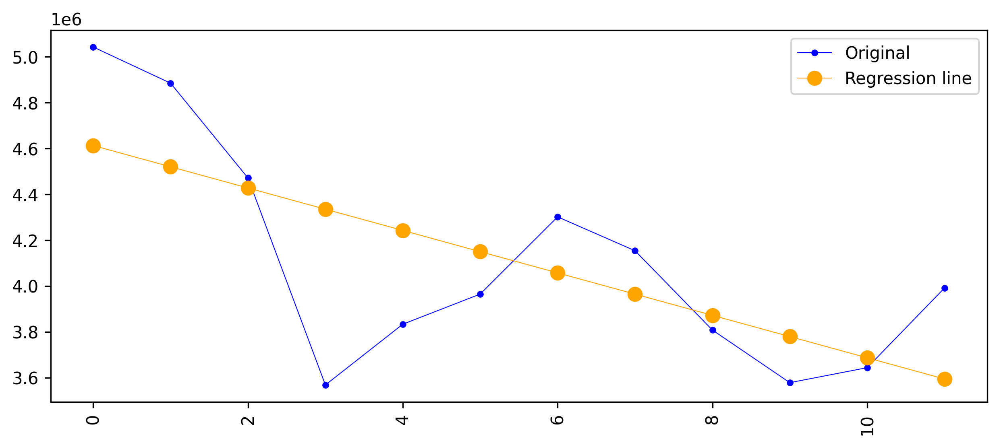

Slope -17308.926573426696
NRMSE: 0.3341652685383988


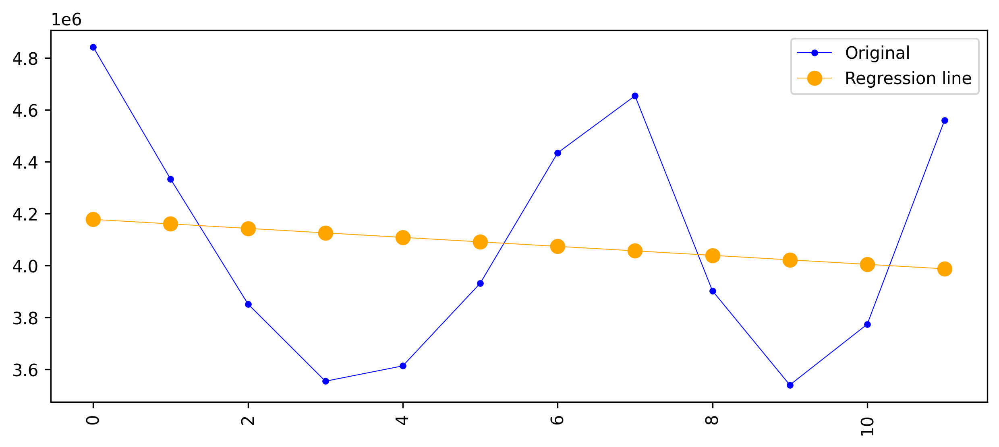

Slope 8576.276223776094
NRMSE: 0.2938198724352779


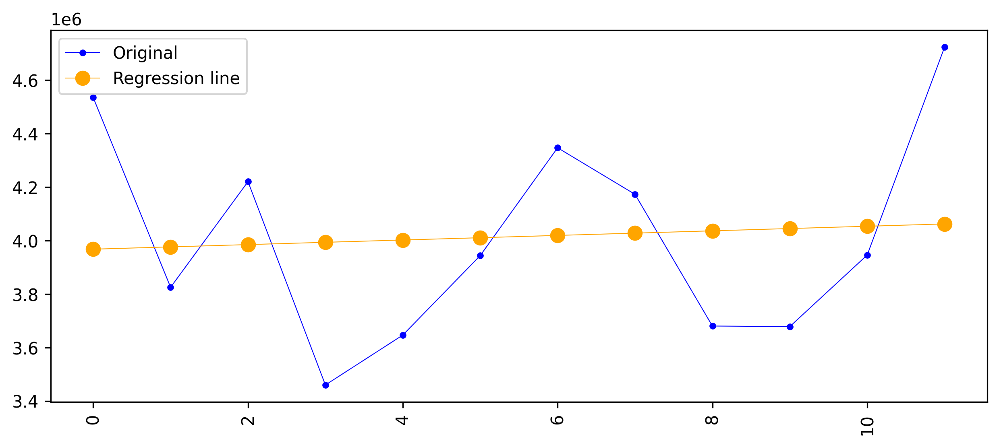

Slope [-8716.06903623]
NRMSE: 0.1323987800590973


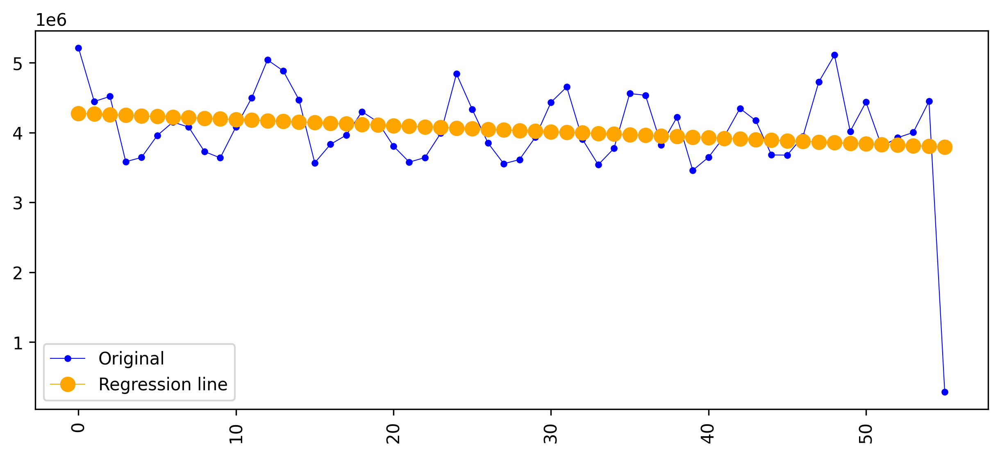

In [25]:
#check for trend
cols_plot = ['PJMW_MW']

detect_trend(data_monthly.loc['2014']['PJMW_MW'].values)
detect_trend(data_monthly.loc['2015']['PJMW_MW'].values)
detect_trend(data_monthly.loc['2016']['PJMW_MW'].values)
detect_trend(data_monthly.loc['2017']['PJMW_MW'].values)
detect_trend(data_monthly[cols_plot].values)

    The time-series has slight seasonality pattern, such as energy consumption are always low/high at the beginning of the year and high/low at the end of the year.There is always an upward     trend within any single year with a couple of low months in the mid of the year

# check stationarity using the following methods:-
    (1) Rolling Plots: review a time series plot ( moving average or moving variance) of the data and visually check if there are any obvious trends or seasonality.

        (2) Summary Statistics: review the summary statistics for the data for seasons or random
        partitions and check for obvious or significant differences.

    (3) Statistical Tests: use statistical tests to check if the expectations of stationarity are met or have been violated.

    Dickey-Fuller Test: This is one of the statistical tests for checking stationarity.

    Here the null hypothesis is that the TS is non-stationary.

        The test results comprise of a Test Statistic and some Critical Values for difference
        confidence levels.

    If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis  and say that the series is stationary

# Stationarity test : Method 1 : Plots

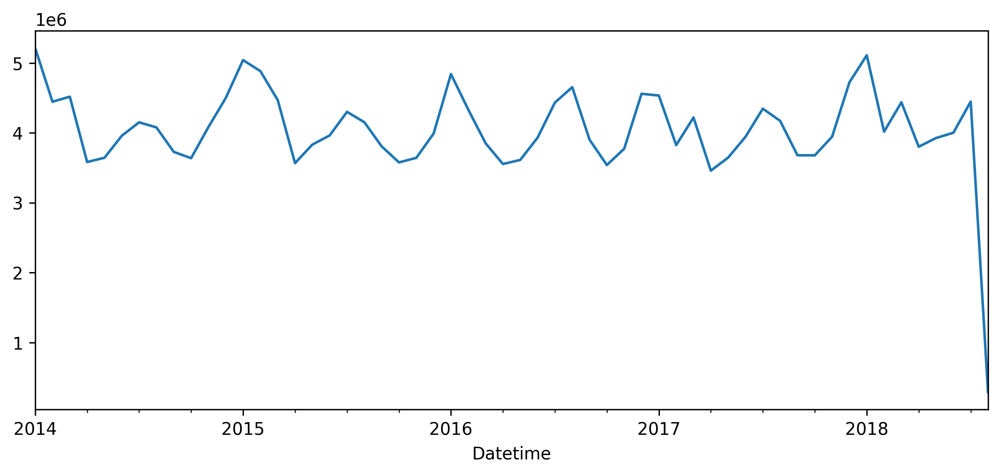

In [26]:
data_monthly['PJMW_MW'].plot();

# Stationarity test : Method 2 : Summary Statistics

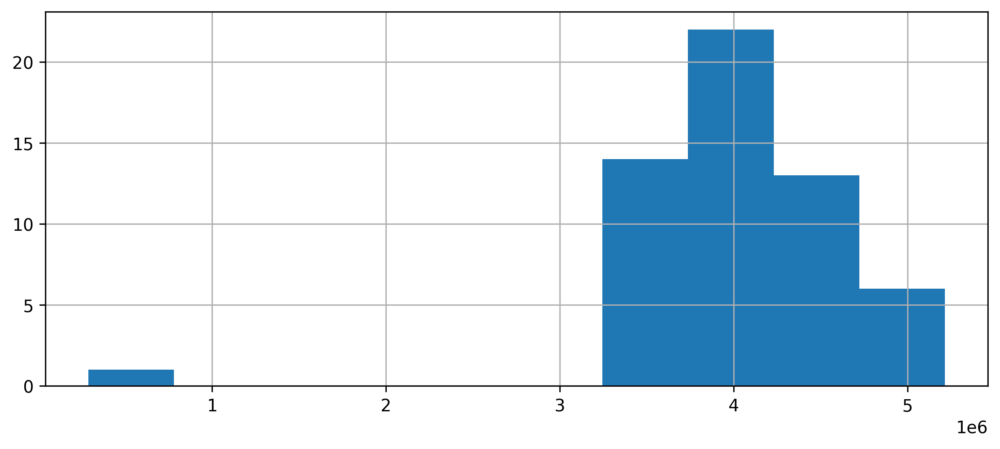

In [27]:
data_monthly['PJMW_MW'].hist();

In [28]:
X = data_monthly['PJMW_MW'].values
split = len(X) / 2
split = int(split)

X1, X2 = X[0:split], X[split:]

mean1, mean2 = X1.mean(), X2.mean()
var1,  var2  = X1.var(),  X2.var()

print('mean1     = {:10.2f}, mean2     = {:10.2f}'.format(mean1, mean2))
print('variance1 = {:10.2f}, variance2 = {:10.2f}'.format(var1,  var2))

mean1     = 4120442.36, mean2     = 3951115.00
variance1 = 219114340487.23, variance2 = 657481094782.93


 - the mean and variance values are different. But in the same ball-park range.
- Hence the time series is stationary

# Stationarity test : Method 3 : Augmented Dickey-Fuller test - (ADF) test
       The intuition behind the test is that it determines how strongly a time series is defined by a trend. (i.e no stationarity)
 - time series is __not stationary __

 - time series is stationary

    p-value <= 0.05: Reject the null hypothesis (
    ), the data does not have a unit root and is stationary.

    p-value > 0.05: Fail to reject the null hypothesis (
    ), the data has a unit root and is non-stationary.

In [29]:
from statsmodels.tsa.stattools import adfuller

In [30]:
for year in np.unique(data.Year):
    #detect_trend(data_grouped.loc[str(year)]['Sales'].values)

    X = data.loc[str(year)]['PJMW_MW'].values

    result = adfuller(X)
    
    print('\nFor the year : ', year)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')

    for key, value in result[4].items():
        print('\t%5s: %8.3f' % (key, value))

X = data['PJMW_MW'].values

result = adfuller(X)

print('\nFor the CONSOLIDATED 4 years')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')

for key, value in result[4].items():
    print('\t%5s: %8.3f' % (key, value)) 


For the year :  2014
ADF Statistic: -6.946296
p-value: 0.000000
Critical Values:
	   1%:   -3.431
	   5%:   -2.862
	  10%:   -2.567

For the year :  2015
ADF Statistic: -5.536071
p-value: 0.000002
Critical Values:
	   1%:   -3.431
	   5%:   -2.862
	  10%:   -2.567

For the year :  2016
ADF Statistic: -6.108313
p-value: 0.000000
Critical Values:
	   1%:   -3.431
	   5%:   -2.862
	  10%:   -2.567

For the year :  2017
ADF Statistic: -7.240120
p-value: 0.000000
Critical Values:
	   1%:   -3.431
	   5%:   -2.862
	  10%:   -2.567

For the year :  2018
ADF Statistic: -5.939557
p-value: 0.000000
Critical Values:
	   1%:   -3.432
	   5%:   -2.862
	  10%:   -2.567

For the CONSOLIDATED 4 years
ADF Statistic: -11.682016
p-value: 0.000000
Critical Values:
	   1%:   -3.431
	   5%:   -2.862
	  10%:   -2.567


# conclusion
1. Consolidated years - p-value is less than .05 or .01. hence H0 can be rejected.
2. H0 : Not stationary
3. Means TS is stationary
4. Yearly- p-value method : p-value is 
5. 0.05 so we reject the null hypothesis for yearly TS

### Making time series stationary

In [31]:
def test_stationarity(timeseries, reduced_timeseries=None, smoothing_type='R'):
     
    # Plot rolling statistics:
    orig = plt.plot(timeseries,
                    marker='.', 
                    linestyle='-', 
                    linewidth=0.5,
                    color='blue',  
                    label='Original')
    
    mean = plt.plot(reduced_timeseries, 
                    marker='.', 
                    linestyle='-', 
                    linewidth=0.5,
                    color='red',   
                    label='Reduced')
    
    if smoothing_type == 'R':
        title = 'Smoothing by Rolling MA'
    elif smoothing_type == 'E':
        title = 'Smoothing by Exponential weighted MA'
    else:
        title = 'Default MA'
        
    plt.legend(loc='best')
    plt.title(title)
    plt.show(block=False)
    
    # Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(reduced_timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
        
    print (dfoutput)

### Reduce noise
 - Aggregation – taking average for a time period like monthly/weekly averages

 - Smoothing – taking rolling averages (Moving average)

 - Polynomial Fitting – fit a regression model

### 1. Smoothing - Moving average
 - In this approach, we take average of ‘k’ consecutive values depending on the frequency of time    series. Here we can take the average over the past 1 year, i.e. last 12 values. Pandas has specific functions defined for determining rolling statistics.

In [32]:
ts = data_monthly['PJMW_MW']
moving_avg = ts.rolling(window=12).mean()
moving_avg.head()

Datetime
2014-01-31   NaN
2014-02-28   NaN
2014-03-31   NaN
2014-04-30   NaN
2014-05-31   NaN
Freq: M, Name: PJMW_MW, dtype: float64

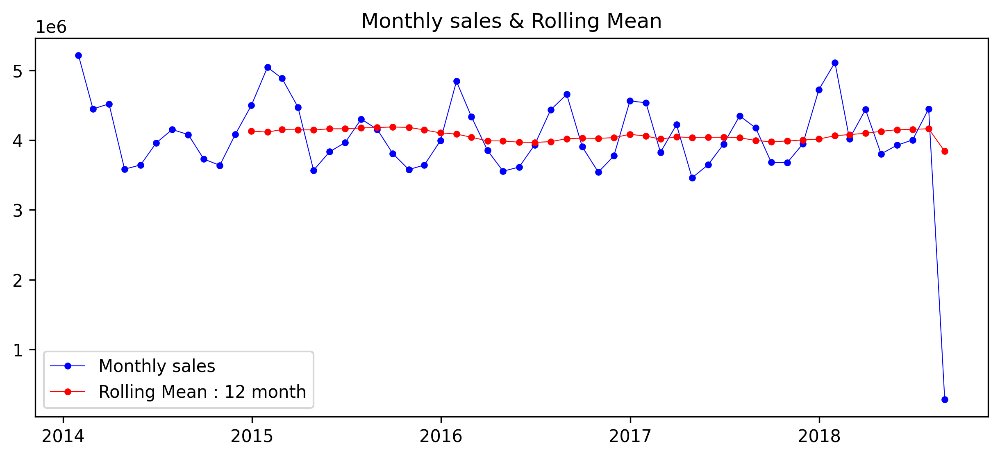

In [33]:
plt.plot(ts, marker='.', linestyle='-', linewidth=0.5, label='Monthly sales', c='b')
plt.plot(moving_avg, marker='.', linestyle='-', linewidth=0.5, color='red', label='Rolling Mean : 12 month');

plt.legend(loc='best')
plt.title('Monthly sales & Rolling Mean');

Lets the rolling means subtract this from the original series(log transformed).

Note that since we are taking average of last 12 values, rolling mean is not defined for first 11 values.

In [34]:
ts_moving_avg_diff = ts - moving_avg
ts_moving_avg_diff.head(5)

Datetime
2014-01-31   NaN
2014-02-28   NaN
2014-03-31   NaN
2014-04-30   NaN
2014-05-31   NaN
Freq: M, Name: PJMW_MW, dtype: float64

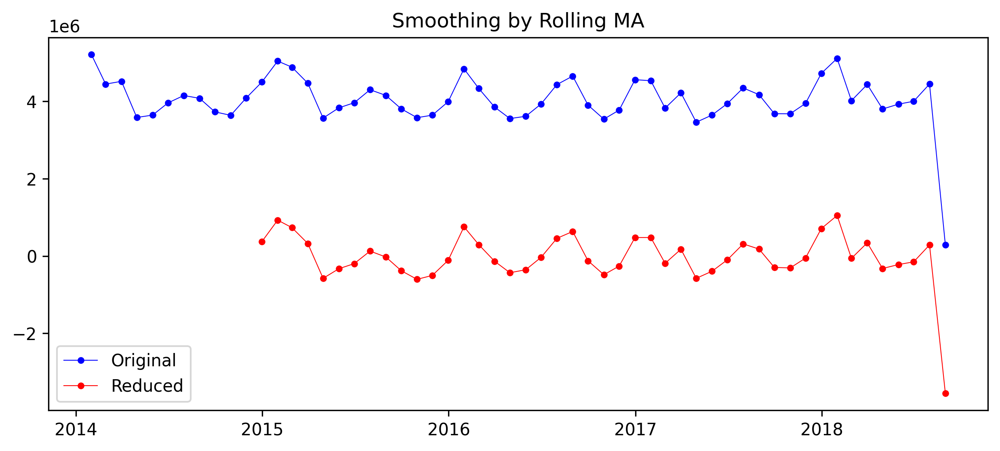

Results of Dickey-Fuller Test:
Test Statistic                 -2.913273
p-value                         0.043826
#Lags Used                      8.000000
Number of Observations Used    36.000000
Critical Value (1%)            -3.626652
Critical Value (5%)            -2.945951
Critical Value (10%)           -2.611671
dtype: float64


In [35]:
ts_moving_avg_diff.dropna(inplace=True)
test_stationarity(ts, ts_moving_avg_diff, 'R')

### observation
 - The rolling values appear to be varying slightly but there is no specific trend.
 - Also, the test statistic is smaller than the 5% critical values so we can say with 95% confidence   that this is a stationary series.
### conclusion
1.p-value method : p-value of 0.043826 is <
0.05 so we REJECT the null hypothesis. The null hypothesis is : the TS is NON-STATTIONARY. Hence it is proved that TS is stationary

    2.Critical value : Our statistic value of -2.913273 is more than the value of -2.611671 at 10%. So this falls in the rejection region. Hence we REJECT the null hypothesis. i.e TS is stationary

### 2. exponentially weighted moving average

In [36]:
ewma = pd.Series.ewm 

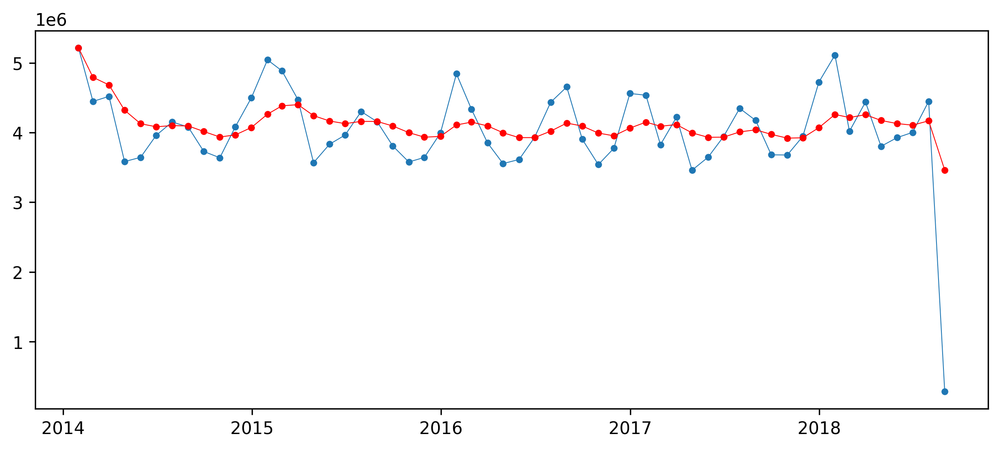

In [37]:
fwd_exp_weighted_avg = ewma(ts, span=10).mean() 

plt.plot(ts, marker='.', linestyle='-', linewidth=0.5,)
plt.plot(fwd_exp_weighted_avg, marker='.', linestyle='-', linewidth=0.5, color='red');

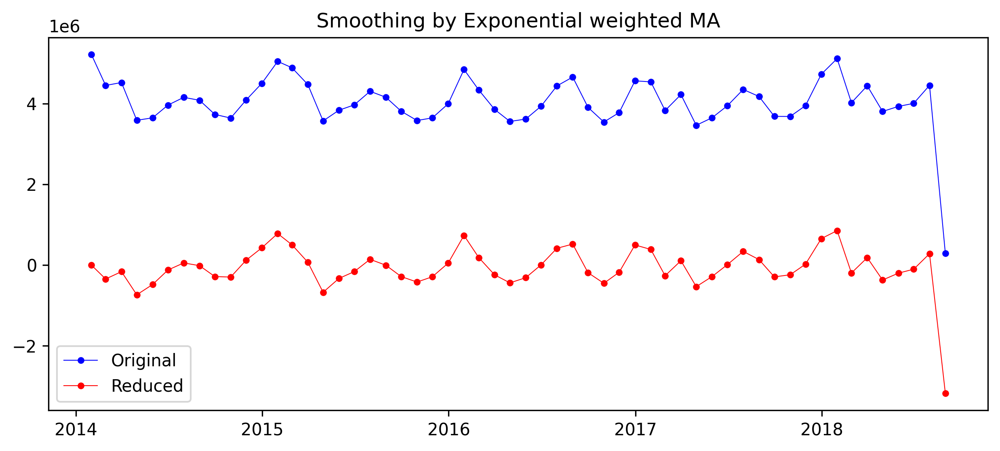

Results of Dickey-Fuller Test:
Test Statistic                 -3.510318
p-value                         0.007726
#Lags Used                      8.000000
Number of Observations Used    47.000000
Critical Value (1%)            -3.577848
Critical Value (5%)            -2.925338
Critical Value (10%)           -2.600774
dtype: float64


In [38]:
ts_ewma_diff = ts - fwd_exp_weighted_avg
test_stationarity(ts, ts_ewma_diff, 'E')

### Decomposition of a time series into its components(trend, seasonality,noise):
You can do a classical decomposition of a time series by considering the series as an additive or multiplicative combination of the base level, trend, seasonal index and the residual.

The seasonal_decompose in statsmodels implements this conveniently.

visualize our data using a method called time-series decomposition that allows us to decompose our time series into 3 distinct components: - trend, - seasonality, and - noise.

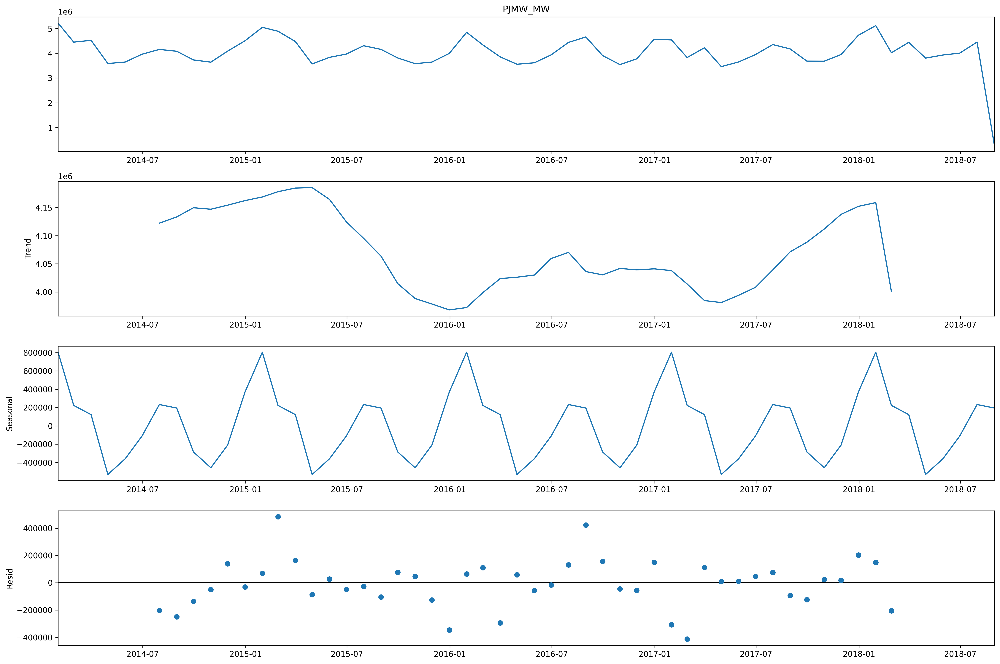

In [39]:
#Multiplicative Decomposition 

from statsmodels.tsa.seasonal import seasonal_decompose

plt.rcParams['figure.figsize'] = 18, 12

result_additive = seasonal_decompose(data_monthly['PJMW_MW'],
                                     model='additive')

fig = result_additive.plot()

The plot above clearly shows that the power consumption in MW is unstable, along with its obvious seasonality. We can still see noises

# Time series forecasting with ARIMA
 - ARIMA, short for ‘Auto Regressive Integrated Moving Average’ is actually a class of models that ‘explains’ a given time series based on its own past values, that is, its own lags and the lagged forecast errors, so that equation can be used to forecast future values.

 - Any ‘non-seasonal’ time series that exhibits patterns and is not a random white noise can be modeled with ARIMA models.

 - An ARIMA model is characterized by 3 terms: p, d, q where,

  - p is the order of the AR term
  - q is the order of the MA term
  - d is the number of differencing required to make the time series stationary
  
If a time series, has seasonal patterns, then you need to add seasonal terms and it becomes SARIMA, short for ‘Seasonal ARIMA’.

#### d term

 - The first step to build an ARIMA model is to make the time series stationary. Why?

 - Because, term ‘Auto Regressive’ in ARIMA means it is a linear regression model that uses its own lags as predictors. Linear regression models, as you know, work best when the predictors are not correlated and are independent of each other.

 - The most common approach is to difference it. That is, subtract the previous value from the current value. Sometimes, depending on the complexity of the series, more than one differencing may be needed.

 - The value of d, therefore, is the minimum number of differencing needed to make the series stationary.

 - And if the time series is already stationary, then d = 0.

#### Next, what are the ‘p’ and ‘q’ terms?
- ‘p’ is the order of the ‘Auto Regressive’ (AR) term. It refers to the number of lags of Y to be used as predictors.

 - And ‘q’ is the order of the ‘Moving Average’ (MA) term. It refers to the number of lagged forecast errors that should go into the ARIMA Model.

  **ARIMA model in words:**

Predicted 
 = Constant + Linear combination Lags of Y (upto p lags) + Linear Combination of Lagged forecast errors (upto q lags)

# (1) How to find the order of differencing (d) in ARIMA model

 - The purpose of differencing it to make the time series stationary.

 - But we need to be careful to not over-difference the series. Because, an over differenced series may still be non-stationary, which in turn will affect the model parameters.

 - **So how to determine the right order of differencing? **

 - The right order of differencing is the minimum differencing required to get a near-stationary series which roams around a defined mean and the ACF plot reaches to zero fairly quick.

 - If the autocorrelations are positive for many number of lags (10 or more), then the series needs further differencing.

 - On the other hand, if the lag 1 autocorrelation itself is too negative, then the series is probably over-differenced.

(1) First, check if the series is stationary using the Augmented Dickey Fuller test (adfuller()), from the statsmodels package.

- Because, you need differencing only if the series is non-stationary. 
- Else, no differencing is needed, that is, d=0.

The null hypothesis of the ADF test is that the time series is non-stationary. So, if the p-value of the test is less than the significance level (0.05) then you reject the null hypothesis and infer that the time series is indeed stationary.

We are going to apply one of the most commonly used method for time-series forecasting, known as ARIMA, which stands for Autoregressive Integrated Moving Average.

ARIMA models are denoted with the notation ARIMA(p, d, q).

These three parameters account for seasonality, trend, and noise in data:

In [40]:
data.columns

Index(['PJMW_MW', 'Year', 'Quater', 'Month', 'Hour', 'season'], dtype='object')

In [41]:
#check stationarity

result = adfuller(data.loc['2015']['PJMW_MW'].dropna())

print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -5.536071
p-value: 0.000002


Since P-value is less than the significance level of 0.05, that means we should reject the null hypothesis.

H0 : TS is non stationary

It means the TS is stationary

let us check with ACF plot

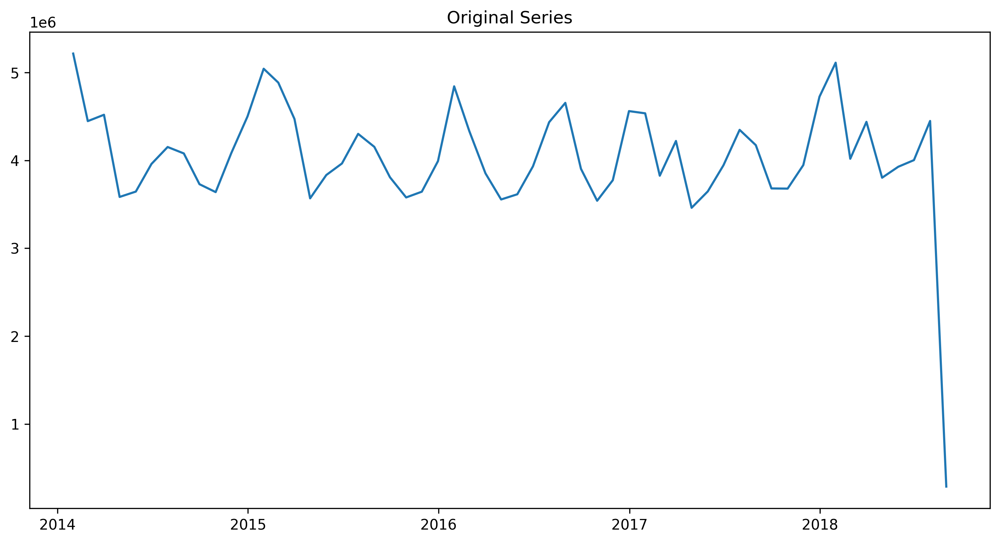

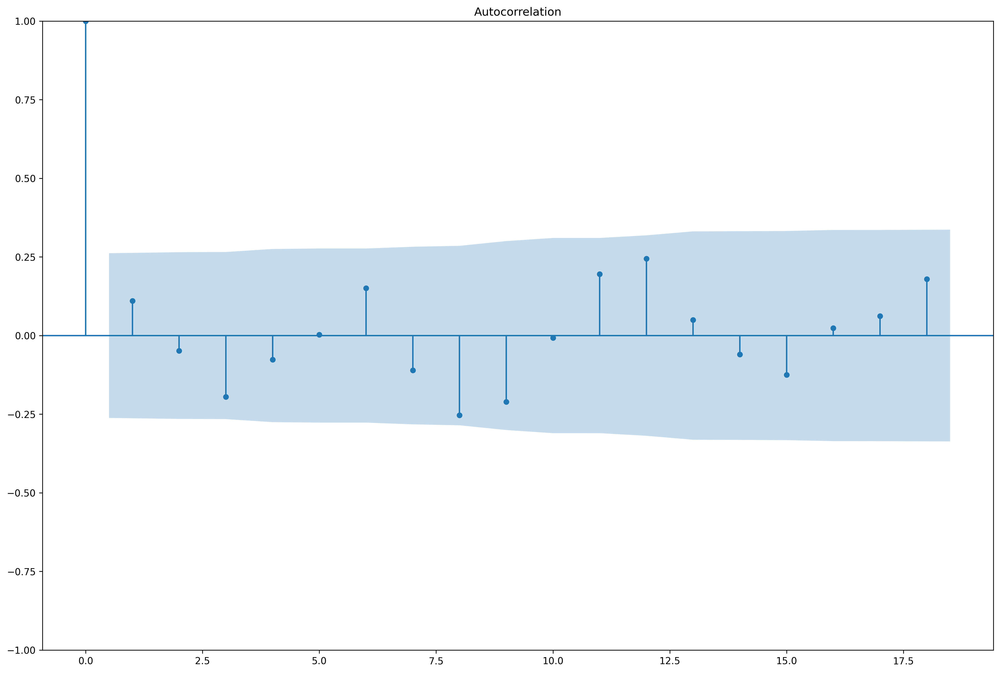

In [42]:
#Original Series
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.figure(figsize=(12, 6))

plt.plot(ts)
plt.title('Original Series')
acf0 = plot_acf(ts)

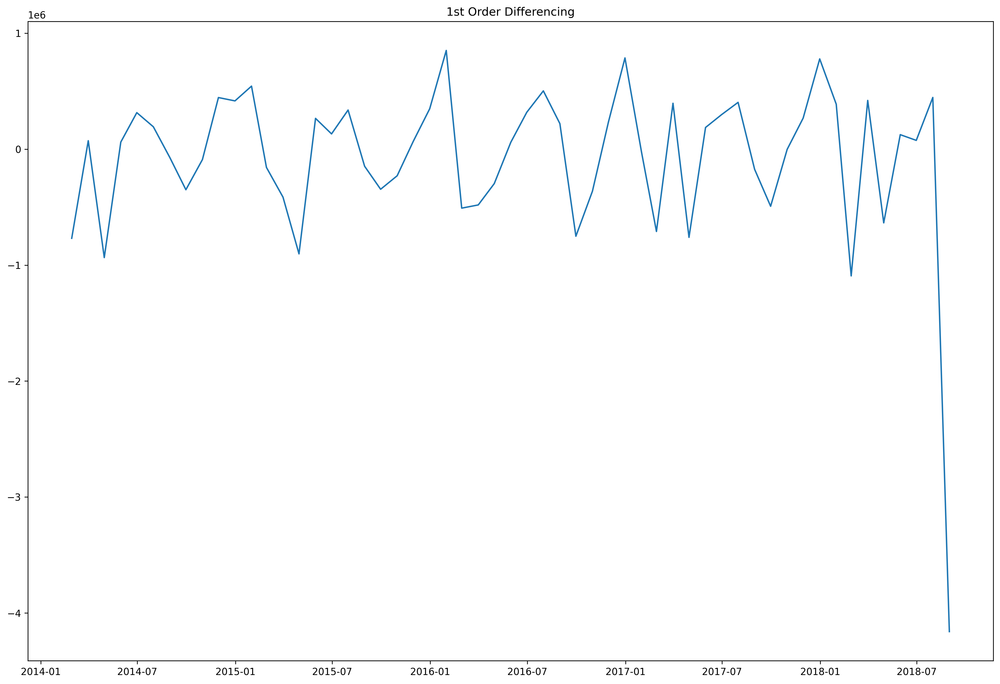

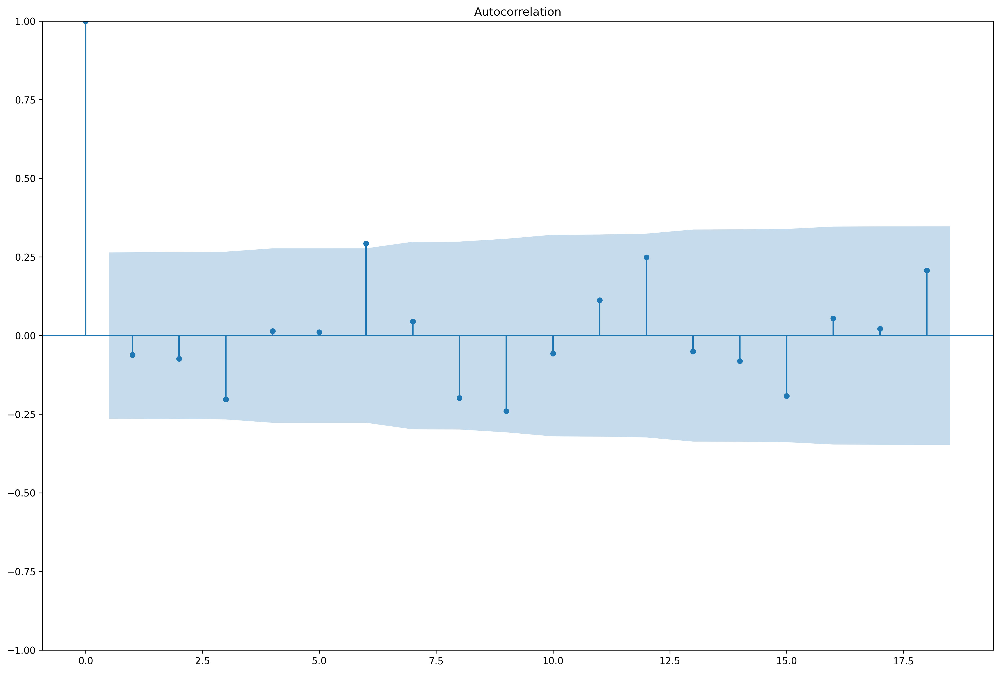

In [43]:
#1st order Differencing

plt.plot(ts.diff()); 
plt.title('1st Order Differencing')
acf1 = plot_acf(ts.diff().dropna())

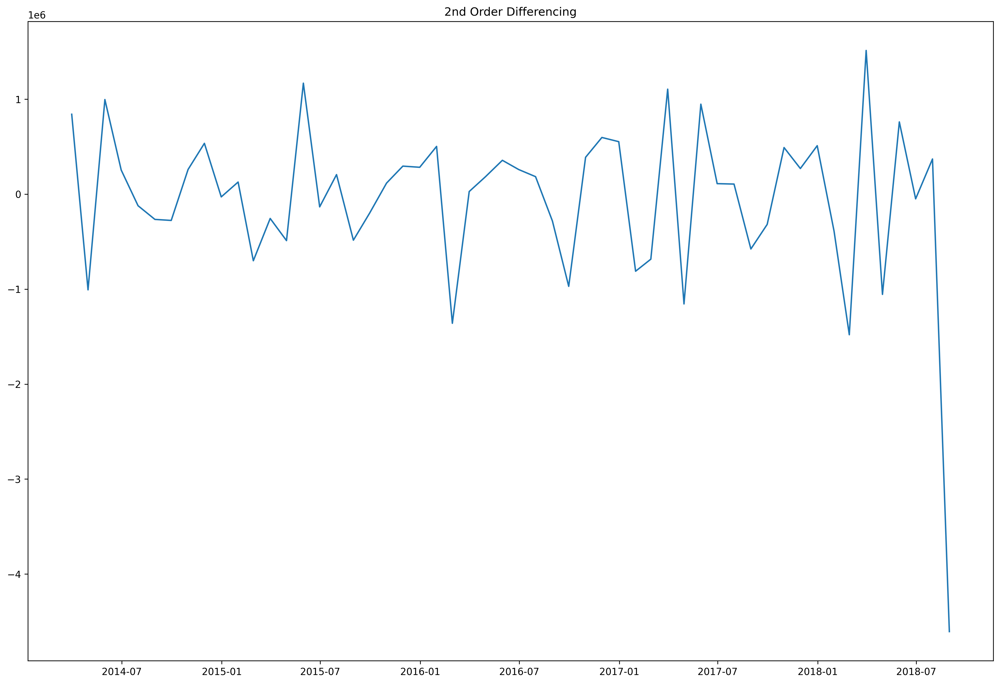

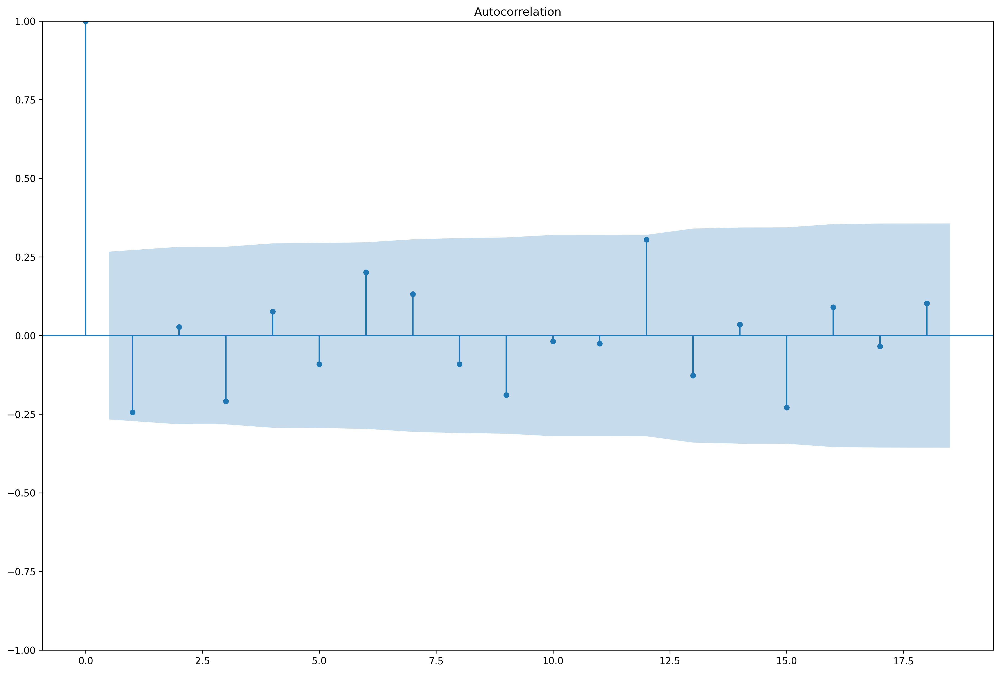

In [44]:
#2nd order Differencing

plt.plot(ts.diff().diff()); 
plt.title('2nd Order Differencing')
acf2 = plot_acf(ts.diff().diff().dropna())

### Observation
For the above series, the time series reaches stationarity without ANY differencing. There is no any statistically significant spikes seen in autocorrelation plot above.

## (2) How to find the order of the AR term (p):

 - After differencing the TS, we need to ensure there is no autocorrelation in the differenced time series

 - determine the AR and MA terms

 - You can find out the required number of AR terms by inspecting the Partial Autocorrelation (PACF) plot.

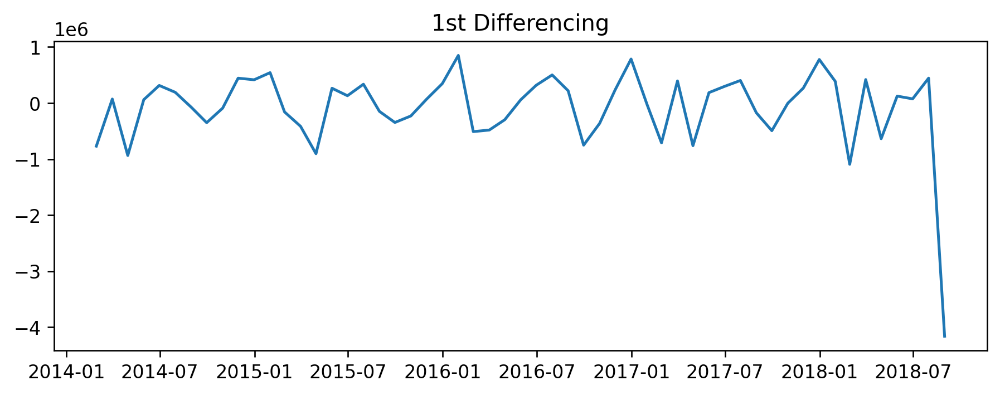

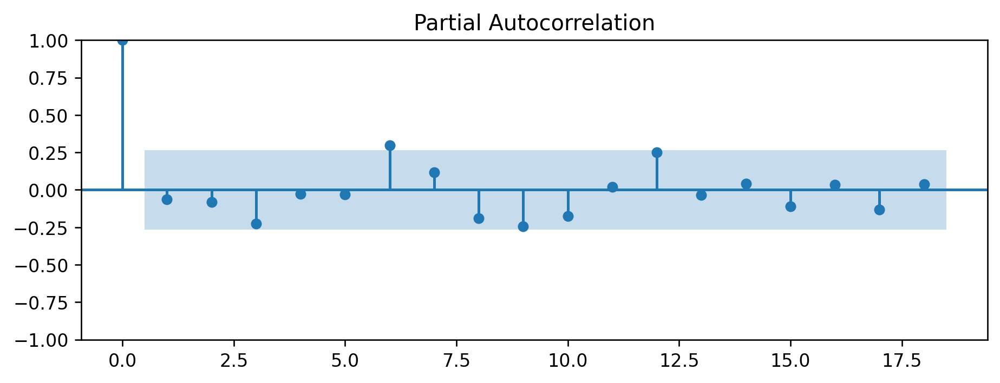

In [45]:
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':240})

plt.plot(ts.diff()); 
plt.title('1st Differencing')

pacf = plot_pacf(ts.diff().dropna())

In above partial autocorrelation plot, we don't observe any significant spikes in lower order lags.

Therefore, we can be conservative and tentatively fix the p as 0 (we can try with 1 later).

### (3) How to find the order of the MA term (q):
look at the ACF plot for the number of MA terms. An MA term is technically, the error of the lagged forecast.

The ACF tells how many MA terms are required to remove any autocorrelation in the stationarized series.

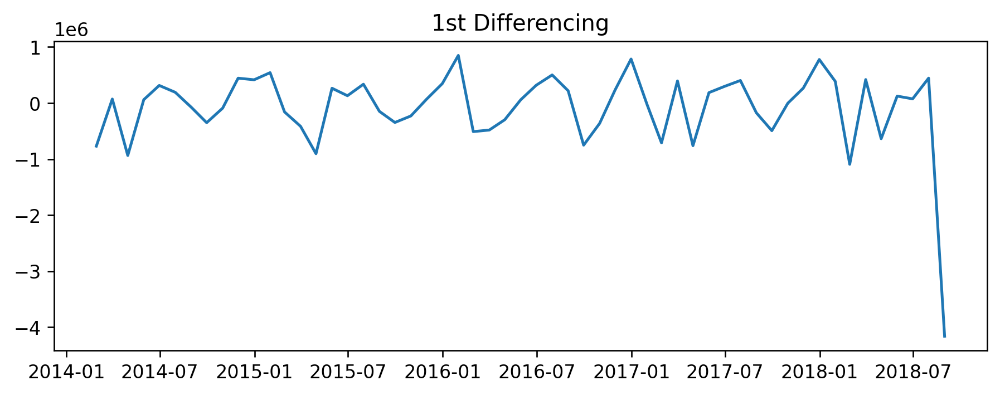

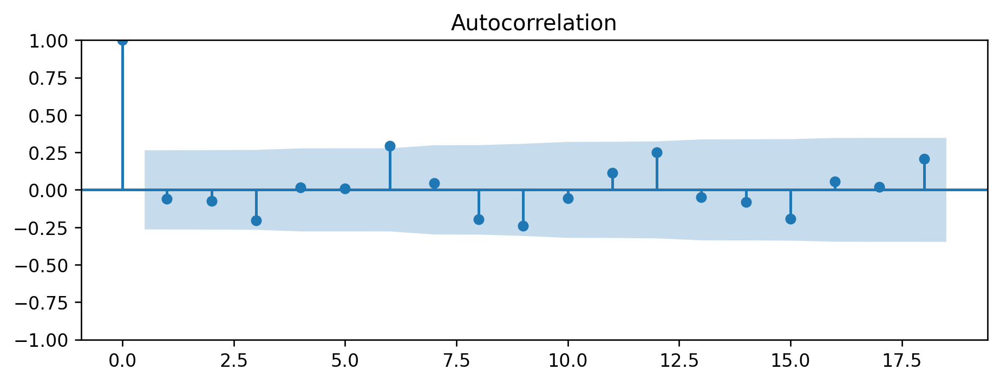

In [46]:
plt.plot(ts.diff()); 
plt.title('1st Differencing')

acf = plot_acf(ts.diff().dropna())

#### Build the ARIMA Model:
Now that we've determined the values of p, d and q, we have everything needed to fit the ARIMA model.

Let’s use the ARIMA() implementation in statsmodels package.

  we will consider d = 0 (later we can try with 1)
  
  we will consider p = 0
  
  we will consider q = 0
  
#### ARIMA with default settings of {0 , 0 , 0}

In [47]:
mod_default = sm.tsa.statespace.SARIMAX(ts,
                                order=(0, 0, 0),
                                seasonal_order=(1, 0 , 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results_default = mod_default.fit()

In [48]:
print(results_default.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.9705      0.049     19.882      0.000       0.875       1.066
ma.S.L12       0.0297      0.212      0.140      0.889      -0.385       0.445
sigma2      8.362e+11      1e-13   8.37e+24      0.000    8.36e+11    8.36e+11


 - The summary attribute that results from the output of SARIMAX returns a significant amount of information, but we'll focus our attention on the table of coefficients.
 

 - The coef column shows the weight (i.e. importance) of each feature and how each one impacts the time series. The P>|z| column informs us of the significance of each feature weight. Here, each weight has a p-value lower or close to 0.05, so it is reasonable to retain all of them in our model.


 - When fitting seasonal ARIMA models, it is important to run model diagnostics to ensure that none of the assumptions made by the model have been violated. The plot_diagnostics object allows us to quickly generate model diagnostics and investigate for any unusual behavior

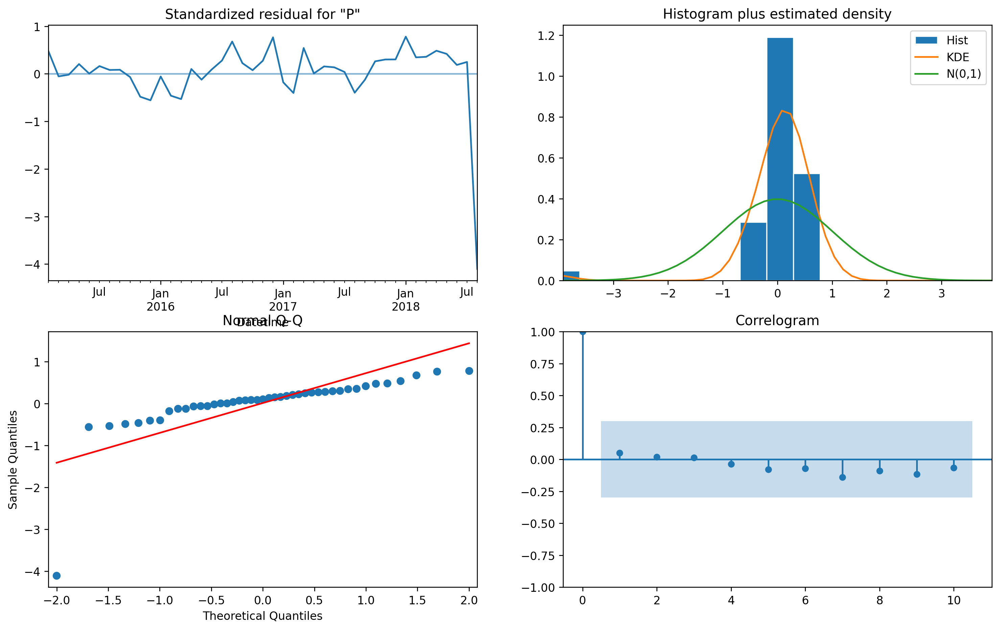

In [49]:
residuals_default = results_default.plot_diagnostics(figsize=(15, 9))

- Our primary concern is to ensure that the residuals of our model are

 - uncorrelated and
 - normally distributed with zero-mean.
- If the seasonal ARIMA model does not satisfy these properties, it is a good indication that it can be further improved.

- In this case, our model diagnostics suggests that the model residuals are normally distributed. Plus more observations as follows:-

 - In the top right plot, we see that the red KDE line really does not follow closely with the N(0,1) line (where N(0,1)) is the standard notation for a normal distribution with mean 0 and standard deviation of 1). Hence the residual plots are not perfectly normally distributed.

 - The qq-plot on the bottom left shows that the moderately ordered distribution of residuals (blue dots) follows the linear trend of the samples taken from a standard normal distribution with N(0, 1). Again, this is not really a strong indication that the residuals are normally distributed.

Those observations lead us to conclude that our model produces a satisfactory fit that could help us understand our time series data and forecast future values.

   Although we have a satisfactory fit, some parameters of our seasonal ARIMA model could be changed to improve our model fit. For example, our grid search only considered a restricted set of parameter combinations, so we may find better models if we widened the grid search.

#### Validating Forecasts:
We have obtained a model for our time series that can now be used to produce forecasts.

We start by comparing predicted values to real values of the time series, which will help us understand the accuracy of our forecasts

The **get_prediction()** and **conf_int()** attributes allow us to obtain the values and associated confidence intervals for forecasts of the time series.

In [50]:
data.columns

Index(['PJMW_MW', 'Year', 'Quater', 'Month', 'Hour', 'season'], dtype='object')

In [51]:
data.index

DatetimeIndex(['2014-01-01 00:00:00', '2014-01-01 01:00:00',
               '2014-01-01 02:00:00', '2014-01-01 03:00:00',
               '2014-01-01 04:00:00', '2014-01-01 05:00:00',
               '2014-01-01 06:00:00', '2014-01-01 07:00:00',
               '2014-01-01 08:00:00', '2014-01-01 09:00:00',
               ...
               '2018-08-02 15:00:00', '2018-08-02 16:00:00',
               '2018-08-02 17:00:00', '2018-08-02 18:00:00',
               '2018-08-02 19:00:00', '2018-08-02 20:00:00',
               '2018-08-02 21:00:00', '2018-08-02 22:00:00',
               '2018-08-02 23:00:00', '2018-08-03 00:00:00'],
              dtype='datetime64[ns]', name='Datetime', length=40200, freq=None)

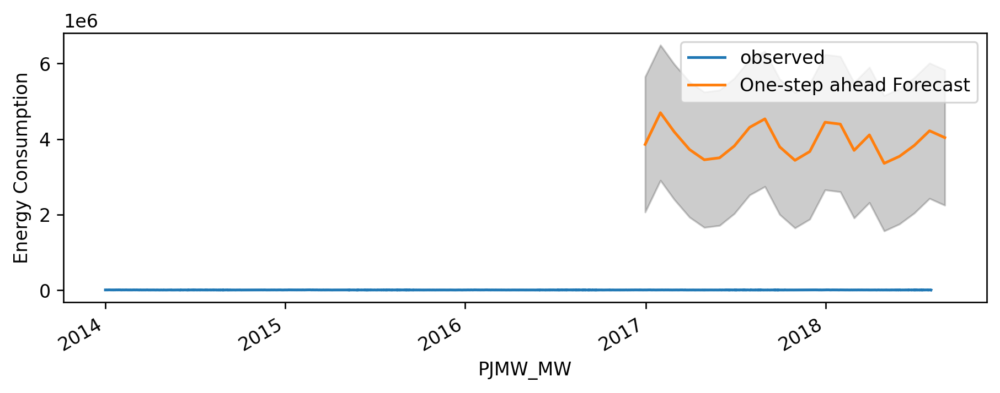

In [52]:
pred = results_default.get_prediction(start=pd.to_datetime('2016-12-31'), dynamic=False)
pred_ci = pred.conf_int()
ax = data.loc['2014':]['PJMW_MW'].plot(label='observed')

pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast')

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('PJMW_MW')
ax.set_ylabel('Energy Consumption')
plt.legend()

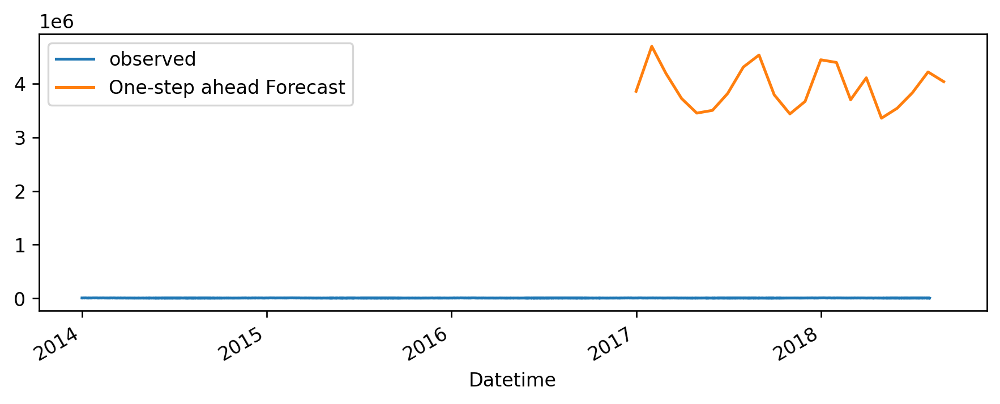

In [53]:
pred = results_default.get_prediction(start=pd.to_datetime('2016-12-31'), dynamic=False)
pred_ci = pred.conf_int()
ax = data.loc['2014':]['PJMW_MW'].plot(label='observed')

pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast')
plt.legend()
plt.show();

In [54]:
#Predicted sales values

y_forecasted = pred.predicted_mean
#Actual sales values

y_truth = data.loc['2016-12-31':]['PJMW_MW']

In [55]:
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 15560202162809.13


In [56]:
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Root Mean Squared Error of our forecasts is 3944642.21


In [57]:
# In statistics, the mean squared error (MSE) of an estimator measures the average of the 
# squares of the errors — that is, the average squared difference between the estimated values 
# and what is estimated. 

# The MSE is a measure of the quality of an estimator — it is always non-negative, and the smaller the MSE, 
# the closer we are to finding the line of best fit.

# Root Mean Square Error (RMSE) tells us that our model was able to forecast the average daily technology sales 
# in the test set within 252.22 of the real sales.

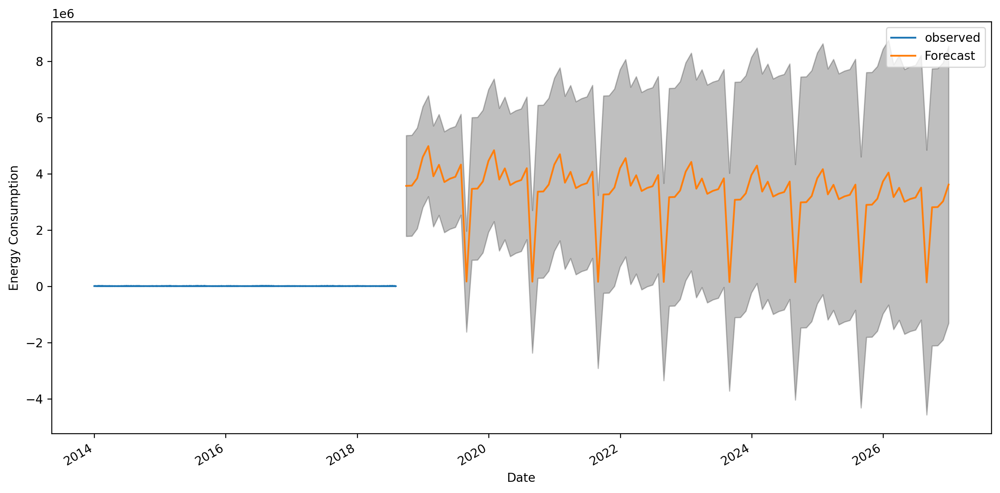

In [58]:
pred_uc = results_default.get_forecast(steps=100)
pred_ci = pred_uc.conf_int()
ax = data['PJMW_MW'].plot(label='observed', figsize=(14, 7))

pred_uc.predicted_mean.plot(ax=ax, label='Forecast')

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)

ax.set_xlabel('Date')
ax.set_ylabel('Energy Consumption')
plt.legend()
plt.show()

## let us try the best parameter search for the ARIMA model ...
#### (1) Parameter Selection for the ARIMA Time Series Model

 - When looking to fit time series data with a seasonal ARIMA model, our first goal is to find the values of ARIMA(p,d,q)(P,D,Q)s that optimize a metric of interest.

 - There are many guidelines and best practices to achieve this goal, yet the correct parametrization of ARIMA models can be a painstaking manual process that requires domain expertise and time.

 - I will use a "grid search" to iteratively explore different combinations of parameters.

 - For each combination of parameters, I fit a new seasonal ARIMA model with the SARIMAX() function from the statsmodels module and assess its overall quality.

 - Once I have explored the entire landscape of parameters, our optimal set of parameters will be the one that yields the best performance for our criteria of interest.

In [59]:
import itertools

# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

In [60]:
pdq

[(0, 0, 0),
 (0, 0, 1),
 (0, 1, 0),
 (0, 1, 1),
 (1, 0, 0),
 (1, 0, 1),
 (1, 1, 0),
 (1, 1, 1)]

In [61]:
#Generate all different combinations of seasonal p, d and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
seasonal_pdq

[(0, 0, 0, 12),
 (0, 0, 1, 12),
 (0, 1, 0, 12),
 (0, 1, 1, 12),
 (1, 0, 0, 12),
 (1, 0, 1, 12),
 (1, 1, 0, 12),
 (1, 1, 1, 12)]

In [62]:
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


I can now use the triplets of parameters defined above to automate the process of training and evaluating ARIMA models on different combinations.

In Statistics and Machine Learning, this process is known as **grid search (or hyperparameter optimization)** for model selection.

When evaluating and comparing statistical models fitted with different parameters, each can be ranked against one another based on how well it fits the data or its ability to accurately predict future data points.

I will use the AIC (Akaike Information Criterion) value, which is conveniently returned with ARIMA models fitted using statsmodels. The AIC measures how well a model fits the data while taking into account the overall complexity of the model.

A model that fits the data very well while using lots of features will be assigned a larger AIC score than a model that uses fewer features to achieve the same goodness-of-fit.

Therefore, I am interested in finding the model that yields the lowest AIC value.

In [63]:
results_params = []
results_aic = []

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(ts,
                                            order       =param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
            results_params.append(str(param) +'x'+ str(param_seasonal))
            results_aic.append(results.aic)
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1832.1198549629137
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:1403.785928166543
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1277.9762822227788
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:3019.16670021465
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1306.174271717298
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1287.2761588808767
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:959.8154238785129
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:2932.143072101601
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1760.6023753687462
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1472.395816699579
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1248.8038317122787
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:2882.272081101748
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1565.2059529706737
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1473.3600136434977
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:962.225420272244
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:2804.3055515341566
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:1612.5454859108386
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1262.496434263519
ARI

In [64]:
results_params_aic = zip(results_params, results_aic)
results_params_aic

In [65]:
#Sort the feature importances by most important first
results_params_aic = sorted(results_params_aic, key = lambda x: x[1], reverse = False)
results_params_aic[:5]

[('(1, 1, 0)x(1, 1, 0, 12)', 907.7294880454252),
 ('(1, 1, 1)x(1, 1, 0, 12)', 908.673692368478),
 ('(1, 0, 0)x(1, 1, 0, 12)', 933.9472412841043),
 ('(0, 1, 0)x(1, 1, 0, 12)', 934.2993733497123),
 ('(1, 0, 1)x(1, 1, 0, 12)', 934.7384516232986)]

The output of our code suggests that SARIMAX(1, 1, 0)x(1, 1, 0, 12) yields the lowest AIC value of 907.72948.

We should therefore consider this to be the optimal option out of all the models we have considered.

# (2) Fitting an ARIMA Time Series Model:

In [66]:
mod = sm.tsa.statespace.SARIMAX(ts,
                                order=(1, 1, 0),
                                seasonal_order=(1, 1, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results = mod.fit()

In [67]:
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3673      0.641     -0.573      0.566      -1.623       0.888
ar.S.L12       0.1914      0.265      0.722      0.470      -0.328       0.711
sigma2      4.657e+11   2.67e-12   1.75e+23      0.000    4.66e+11    4.66e+11


 - The summary attribute that results from the output of SARIMAX returns a significant amount of information, but I'll focus our attention on the table of coefficients.

 - The coef column shows the weight (i.e. importance) of each feature and how each one impacts the time series. The P>|z| column informs us of the significance of each feature weight. Here, each weight has a p-value lower or close to 0.05, so it is reasonable to retain all of them in our model.(except ar.S.L12

 - When fitting seasonal ARIMA models (and any other models for that matter), it is important to run model diagnostics to ensure that none of the assumptions made by the model have been violated. The plot_diagnostics object allows us to quickly generate model diagnostics and investigate for any unusual behavior.

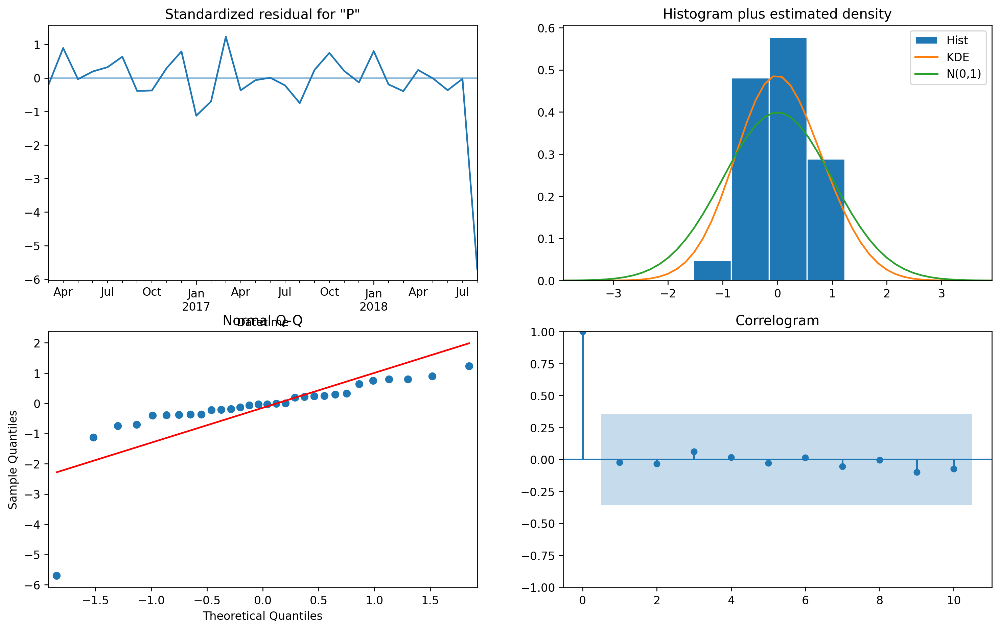

In [68]:
residuals = results.plot_diagnostics(figsize=(15, 9))

- Our primary concern is to ensure that the residuals of our model are

  - uncorrelated and
  - normally distributed with zero-mean.
- If the seasonal ARIMA model does not satisfy these properties, it is a good indication that it can be further improved.

- In this case, our model diagnostics suggests that the model residuals are normally distributed. Plus more observations as follows:-

  - In the top right plot, we see that the red KDE line really does not follow closely with the N(0,1) line (where N(0,1)) is the standard notation for a normal distribution with mean 0 and standard deviation of 1). Hence the residual plots are not perfectly normally distributed.

  - The qq-plot on the bottom left shows that the moderately ordered distribution of residuals (blue dots) follows the linear trend of the samples taken from a standard normal distribution with N(0, 1). Again, this is not really a strong indication that the residuals are normally distributed.

Those observations lead us to conclude that our model produces a satisfactory fit that could help us understand our time series data and forecast future values.

Although we have a satisfactory fit, some parameters of our seasonal ARIMA model could be changed to improve our model fit. For example, our grid search only considered a restricted set of parameter combinations, so we may find better models if we widened the grid search.

## Validating Forecasts
I have obtained a model for our time series that can now be used to produce forecasts.

I start by comparing predicted values to real values of the time series, which will help us understand the accuracy of our forecasts.

The **get_prediction()** and **conf_int()** attributes allow us to obtain the values and associated confidence intervals for forecasts of the time series.

In [69]:
pred = results.get_prediction(start=pd.to_datetime('2016-12-31'), dynamic=False)
pred_ci = pred.conf_int()

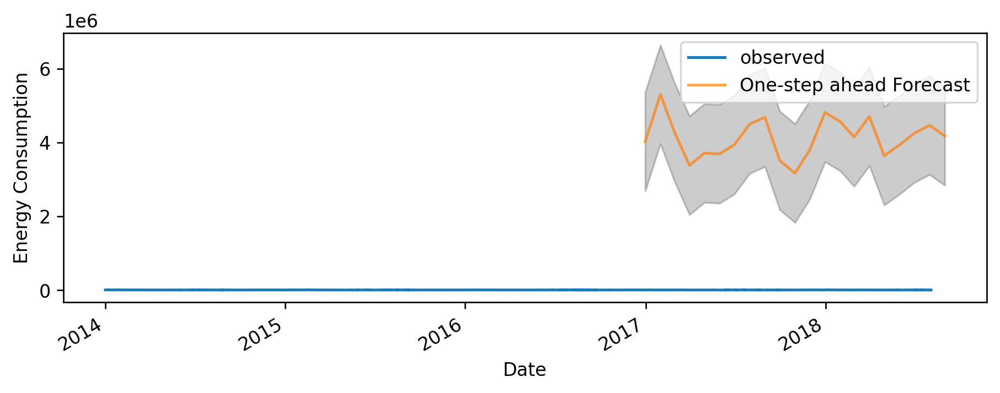

In [70]:
ax = data.loc['2014':]['PJMW_MW'].plot(label='observed')

pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Energy Consumption')
plt.legend();

Overall, our forecasts slightly differs with the true values, but shows an upward trend starts from the beginning of the year and captured the seasonality toward the end of the year.

## Accuracy of prediction (metrics)
MSE (Mean Squared Error) which summarizes the average error of our forecasts. For each predicted value, we compute its distance to the true value and square the result. The results need to be squared so that positive/negative differences do not cancel each other out when we compute the overall mean.

In [71]:
# Predicted sales values
y_forecasted = pred.predicted_mean

# actual sales values
y_truth = data.loc['2016-12-31':]['PJMW_MW']

In [72]:
# Compute the mean square error
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of our forecasts is 17276177676148.47
The Root Mean Squared Error of our forecasts is 4156462.16


## Dynamic forecasts

In [73]:
pred_dynamic = results.get_prediction(start=pd.to_datetime('2016-12-31'), dynamic=True)
pred_dynamic_ci = pred.conf_int()

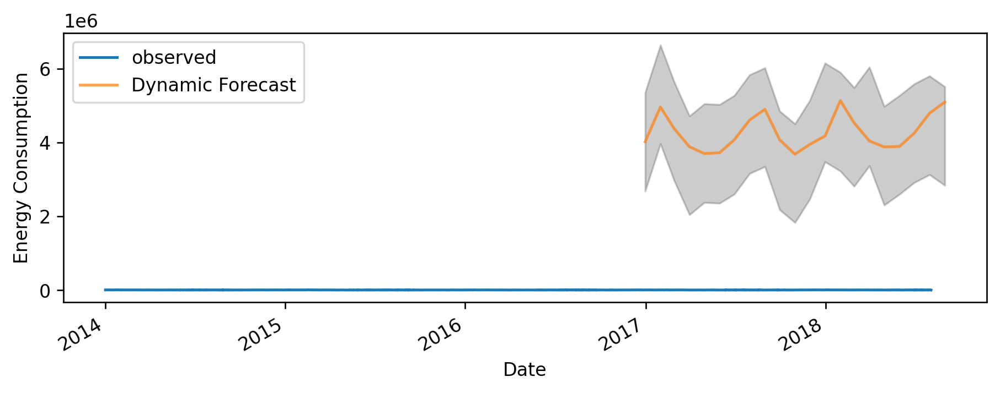

In [74]:
ax = data.loc['2014':]['PJMW_MW'].plot(label='observed')

pred_dynamic.predicted_mean.plot(ax=ax, label='Dynamic Forecast', alpha=.7)

ax.fill_between(pred_dynamic_ci.index,
                pred_dynamic_ci.iloc[:, 0],
                pred_dynamic_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Energy Consumption')
plt.legend();

Evenwith this dynamic forcasts model, our forecasts slightly differs with the true values, but shows an upward trend starts from the beginning of the year and captured the seasonality toward the end of the year

In [75]:
# Predicted sales values
y_forecasted = pred_dynamic.predicted_mean

# actual sales values
y_truth = data.loc['2016-12-31':]['PJMW_MW']

In [76]:
# Compute the mean square error
mse = ((y_forecasted - y_truth) ** 2).mean()

print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of our forecasts is 18067040295800.26
The Root Mean Squared Error of our forecasts is 4250534.12


### Producing and Visualizing future Forecasts

In [77]:
# Get forecast 500 steps ahead in future
pred_uc = results.get_forecast(steps=500)

# Get confidence intervals of forecasts
pred_ci = pred_uc.conf_int()

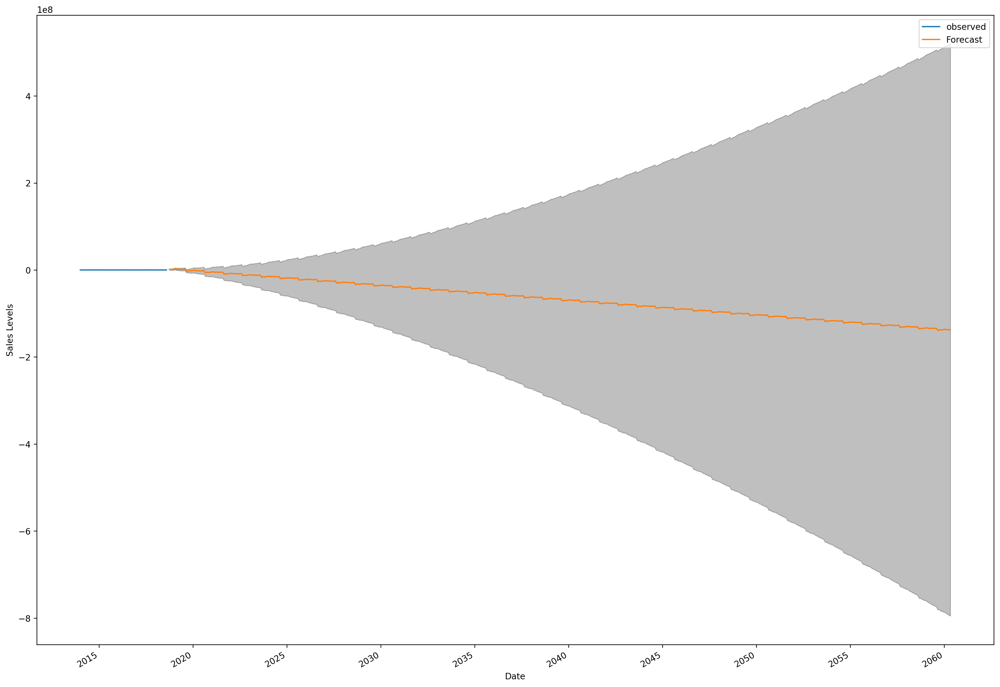

In [78]:
ax = data['PJMW_MW'].plot(label='observed', figsize=(20, 15))

pred_uc.predicted_mean.plot(ax=ax, label='Forecast')

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)

ax.set_xlabel('Date')
ax.set_ylabel('Sales Levels')

plt.legend();

 - Both the forecasts and associated confidence interval that we have generated can now be used to further understand the time series and foresee what to expect.

 - Our forecasts show that the time series is expected to increase linearly.

 - As we forecast further out into the future, it is natural for us to become less confident in our values.

 - This is reflected by the confidence intervals generated by our model, which grow larger as we move further out into the future.